In [8]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import os

# Preparación de los datos

In [9]:
# Direcciones de los archivos
train_path  = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/train/'
test_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
val_path  = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/valid/'

In [10]:
#se crean tres listas (train, test y val) con todas las imágenes (archivos que acaban con extensión jpg)
train_images = [image for image in os.listdir(train_path) if image[-3:] =='jpg' ]
test_images = [image for image in os.listdir(test_path) if image[-3:] =='jpg' ]
val_images = [image for image in os.listdir(val_path) if image[-3:] =='jpg' ]
len(train_images),len(test_images),len(val_images)

(1502, 215, 429)

In [11]:
import glob
import os
#Se usa la librería glob para buscar todos los archivos con extensión json que tendrán las
#etiquetas. Se almacenan en tres listas
train_annotations = glob.glob(os.path.join(train_path, '*.json'))
test_annotations = glob.glob(os.path.join(test_path, '*.json'))
val_annotations = glob.glob(os.path.join(val_path, '*.json'))


In [12]:
import json
#se procesan los json
train_annotations = json.load(open(train_annotations[0]))
test_annotations = json.load(open(test_annotations[0]))
val_annotations = json.load(open(val_annotations[0]))

In [ ]:
dict(train_annotations)['info']

In [ ]:
len(train_annotations['annotations']),len(test_annotations['annotations']),len(val_annotations['annotations']),

In [ ]:
np.array(dict(train_annotations)['annotations'][0]['segmentation'][0]).reshape(-1,2)

# Creación de las máscaras

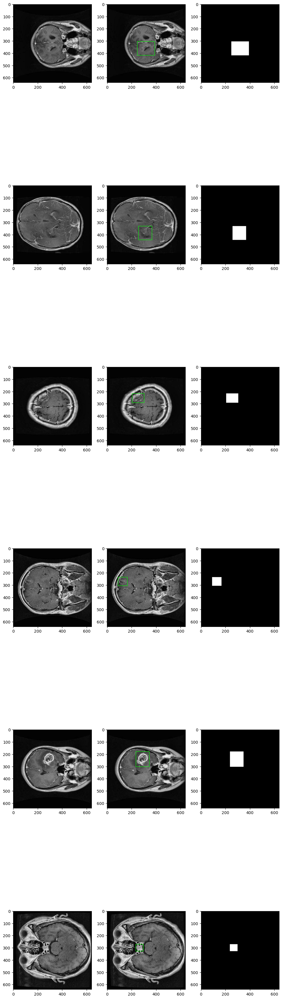

In [6]:
import matplotlib.pyplot as plt

def visualize_random_images(n=5):
    '''
    La función visualiza n imágenes aleatorias. Por cada imagen se muestra:
    1. La imagen original.
    2. La imagen con el contorno del tumor marcado.
    3. La máscara binaria (1 para el área segmentada y 0 en el resto).
    '''
    # Se eligen al azar n imágenes y sus etiquetas correspondientes
    indices = np.random.randint(0, len(train_annotations['images']), size=n)
    images = [train_annotations['images'][i] for i in indices]
    annotations = [train_annotations['annotations'][i] for i in indices]

    j = 1
    plt.figure(figsize=(12, 4 * 2 * n))  # Tamaño del lienzo para mostrar las imágenes

    for img, ann in zip(images, annotations):  # Iterar sobre las imágenes y sus anotaciones
        # Primera columna: Mostrar la imagen original
        plt.subplot(n, 3, j)
        j += 1
        image = cv2.imread(train_path + img['file_name'])  # Leer la imagen original
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convertir a RGB
        plt.imshow(image)  # Mostrar la imagen original

        # Segunda columna: Imagen con el contorno del tumor
        segmentation = ann['segmentation']  # Extraer la segmentación
        segmentation = np.array(segmentation[0], dtype=np.int32).reshape(-1, 2)  # Convertir en coordenadas
        cv2.polylines(image, [segmentation], isClosed=True, color=(0, 255, 0), thickness=2)  # Dibujar el contorno
        plt.subplot(n, 3, j)
        plt.imshow(image)  # Mostrar la imagen con el contorno
        j += 1

        # Tercera columna: Máscara binaria
        mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)  # Crear máscara vacía
        cv2.fillPoly(mask, [segmentation], color=1)  # Rellenar la región segmentada
        plt.subplot(n, 3, j)
        plt.imshow(mask, cmap='gray')  # Mostrar la máscara binaria en escala de grises
        j += 1

# Llamar a la función para visualizar 6 imágenes
visualize_random_images(6)


In [13]:
def _train_masks():
    '''
    Función que crea las máscaras de cada imagen usando las coordenadas
    '''
    print('train masks')
    mask_dir = '/kaggle/working/train_masks/' #se crea un directorio donde se almacenan las máscaras
    os.makedirs(mask_dir, exist_ok=True)
    totalImages = len(train_annotations['images'])
    done = 0
    for img,ann in zip(train_annotations['images'],train_annotations['annotations']):
        path = train_path + img['file_name']
        mask_path = mask_dir + img['file_name']
        # load image in open cv
        image = cv2.imread(path)
        segmentation = ann['segmentation']
        #Se usan las coordenadas de la segmentación para hacer la máscara.
        #Con el reshape se crea un array de coordenadas
        segmentation = np.array(segmentation[0], dtype=np.int32).reshape(-1, 2)
        mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
        cv2.fillPoly(mask, [segmentation], color=(255,255,255))
        #Se guarda la máscara creada en el directorio
        cv2.imwrite(mask_path, mask)
        done+=1

def _test_masks():
    print('test masks')

    totalImages = len(test_annotations['images'])
    done = 0
    mask_dir = '/kaggle/working/test_masks/'
    os.makedirs(mask_dir, exist_ok=True)
    
    for img,ann in zip(test_annotations['images'],test_annotations['annotations']):
        path = test_path + img['file_name']
        mask_path = mask_dir + img['file_name']

        image = cv2.imread(path)
        segmentation = ann['segmentation']
        segmentation = np.array(segmentation[0], dtype=np.int32).reshape(-1, 2)
        mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
        cv2.fillPoly(mask, [segmentation], color=(255,255,255))
        cv2.imwrite(mask_path, mask)
        done+=1



def _val_masks():
    print('val masks')
    totalImages = len(val_annotations['images'])
    done = 0
    mask_dir = '/kaggle/working/val_masks/'
    os.makedirs(mask_dir, exist_ok=True)
    
    for img,ann in zip(val_annotations['images'],val_annotations['annotations']):
        path = val_path + img['file_name']
        mask_path = mask_dir + img['file_name']
        image = cv2.imread(path)
        segmentation = ann['segmentation']
        segmentation = np.array(segmentation[0], dtype=np.int32).reshape(-1, 2)
        mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
        cv2.fillPoly(mask, [segmentation], color=(255,255,255))
        cv2.imwrite(mask_path, mask)
        done+=1


from threading import Thread
def make_masks():
  '''
  Función que usa las tres funciones anteriores para crear las imágenes de las máscaras
  Se usa la función thread para crear las máscaras de train, test y validation de forma
  paralela
  '''
  threads = []
  threads.append( Thread(target=_train_masks))

  threads.append( Thread(target=_test_masks))

  threads.append( Thread(target=_val_masks))
  for t in threads:
    t.start()
  for t in threads:
    t.join()
  print('complete')
  return

make_masks()


train masks
test masks
val masks
complete


In [ ]:
!pip install tensorflow-addons

# Generador de datos

In [8]:
from keras.preprocessing.image import load_img, img_to_array
import tensorflow as tf
from keras.utils import Sequence
class DataGen(Sequence):
    def __init__(self, image_path, mask_path, annotations ,batch_size, target_size=(512, 512)):
        #Se inicializan los atributos necesarios
        self.image_path = image_path # dirección de las imágenes
        self.mask_path = mask_path #dirección de las máscaras
        self.batch_size = batch_size # tamaño de batch
        self.target_size = target_size # tamaño de las imágenes
        self.annotations = annotations # json  con donde aparecen los nombres de las imágenes y sus máscaras
    def __len__(self):
        return int(np.ceil(len(self.annotations['images']) / self.batch_size)) # tamaño del generador
    def __getitem__(self, index):
        #función que irá devolviendo los batches
        # primero se inicializan dos listas que contendrán las imágenes y las máscaras
        image_batch = np.zeros((self.batch_size, self.target_size[0], self.target_size[1], 3), dtype='float32')
        mask_batch = np.zeros((self.batch_size, self.target_size[0], self.target_size[1], 1), dtype='uint8')
        start = self.batch_size * index # se calcula el comienzo del batch
        end = min(self.batch_size * (index + 1), len(self.annotations['images'])) #final del batch
        idx = 0
        for i in range(start, end): # se itera sobre las imáges cargando las correspondientes al batch
            # primero se carga la imágen
            actual_image = cv2.imread(self.image_path + self.annotations['images'][i]['file_name']) 
            # se cambia el tamaño de la imagen
            reshape_image = np.array(cv2.resize(actual_image, self.target_size), dtype='float32')
            #se normaliza la imagen
            norm_image = reshape_image / 255.
            #se almacena la imagen
            image_batch[idx] = norm_image
            # se carga la máscara
            actual_mask = cv2.imread(self.mask_path + self.annotations['images'][i]['file_name'], cv2.IMREAD_GRAYSCALE)
            #se cambia el tamaño de la máscara
            reshape_mask = np.array(cv2.resize(actual_mask, self.target_size), dtype='float32')
            #se binariza la máscara
            reshape_mask = (reshape_mask > 0.5).astype('float32')
            #se almacena la máscara
            mask_batch[idx] = np.expand_dims(reshape_mask, -1)
            idx += 1
        return (image_batch, mask_batch)
            


# Modelos
Todos los modelos siguen una arquitectura U-Net. Esta estructura es de un autoencoder convolucional con conexiones residuales del encoder al decoder. Cada bloque convolucional está compuesto por una primera capa convolucional, una capa batch normalization, otra capa convolucional con el mismo número de filtros que la primera y otra capa convolucional.

## Primer modelo

Modelo de autoencoder U-Net con 3 bloques en el encoder y en el decoder de 32, 64 y 128 y 256 en el cuello de botella.

In [8]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.losses import dice
# Define the convolutional block
def convBlock(inputs, filters, dropout_rate=0):
    c1 = layers.Conv2D(filters, kernel_size=(3, 3), padding="same")(inputs)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.ReLU()(c1)
    c1 = layers.Dropout(dropout_rate)(c1)  # Dropout added

    c2 = layers.Conv2D(filters, kernel_size=(3, 3), padding="same")(c1)
    c2 = layers.BatchNormalization()(c2)
    c2 = layers.ReLU()(c2)
    c2 = layers.Dropout(dropout_rate)(c2)  # Dropout added

    return c2

# Define the encoder block
def encoderBlock(inputs, filters, dropout_rate=0):
    c = convBlock(inputs, filters, dropout_rate)
    m = layers.MaxPooling2D(strides=(2, 2))(c)
    return c, m

# Define the decoder block
def decoderBlock(inputs, skip, filters=64, dropout_rate=0):
    u = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding="same")(inputs)
    skip = layers.Concatenate()([u, skip])
    out = convBlock(skip, filters, dropout_rate)
    return out

# Define the U-Net model
def uNet(image_size):
    inputs = layers.Input(image_size)

    # Encoder with fewer filters
    skip1, encoder_1 = encoderBlock(inputs, 32, 0)  # Reduced filters
    skip2, encoder_2 = encoderBlock(encoder_1, 64, 0)
    skip3, encoder_3 = encoderBlock(encoder_2, 128, 0)

    # Bottleneck
    conv_block = convBlock(encoder_3, 256)

    # Decoder
    decoder_1 = decoderBlock(conv_block, skip3, 128, 0)
    decoder_2 = decoderBlock(decoder_1, skip2, 64, 0)
    decoder_3 = decoderBlock(decoder_2, skip1, 32, 0)

    # Output layer
    outputs = layers.Conv2D(1, 1, padding="same", activation="sigmoid")(decoder_3)

    model = models.Model(inputs, outputs)
    return model
input_shape = (256,256,3)
model = uNet(input_shape)
model.summary()
# Compile the model
from keras.losses import Dice
from keras.metrics import BinaryIoU
from tensorflow.keras.optimizers import Adam
binary_iou = tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)
model.compile(optimizer = Adam(),
              loss = Dice(),
              metrics=['accuracy',binary_iou])



Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 256, 256,  │          0 │ re_lu[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      9,248 │ dropout[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 256, 256,  │          0 │ re_lu_1[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ dropout_1[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 128, 128,  │          0 │ re_lu_2[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     36,928 │ dropout_2[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 128, 128,  │          0 │ batch_normalizat

 Total params: 1,931,233 (7.37 MB)

 Trainable params: 1,928,417 (7.36 MB)

 Non-trainable params: 2,816 (11.00 KB)

In [9]:
import warnings
warnings.filterwarnings("ignore")

early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True, verbose=1)


train_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/train/'
train_mask_path = '/kaggle/working/train_masks/'
val_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/valid/'
val_mask_path = '/kaggle/working/val_masks/'
train_gen = DataGen(train_image_path, train_mask_path, train_annotations, 4, (256,256))
val_gen = DataGen(val_image_path, val_mask_path, val_annotations, 4, (256,256))

# Fit the model
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,  
    verbose=1,
    callbacks=[early_stopping]
)

Epoch 1/50


2024-12-13 10:53:02.697315: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.35047, expected 2.80959
2024-12-13 10:53:02.697388: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 3.81961, expected 3.27872
2024-12-13 10:53:02.697398: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8: 4.35367, expected 3.81278
2024-12-13 10:53:02.697407: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 21: 3.87151, expected 3.33062
2024-12-13 10:53:02.697416: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 30: 4.11246, expected 3.57157
2024-12-13 10:53:02.697425: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 31: 4.24547, expected 3.70459
2024-12-13 10:53:02.697433: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32: 3.83231, expected 3.29143
2024-12-13 10:53:02.697441: E external/local_xla/xl

  3/376 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step - accuracy: 0.8024 - binary_io_u: 0.0458 - loss: 0.9382   

I0000 00:00:1734087192.964398     105 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


376/376 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step - accuracy: 0.8097 - binary_io_u: 0.1108 - loss: 0.8096 - val_accuracy: 0.2643 - val_binary_io_u: 0.0599 - val_loss: 0.9075
Epoch 2/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step - accuracy: 0.9396 - binary_io_u: 0.2177 - loss: 0.6480 - val_accuracy: 0.8169 - val_binary_io_u: 0.1207 - val_loss: 0.7855
Epoch 3/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - accuracy: 0.9520 - binary_io_u: 0.2588 - loss: 0.5895 - val_accuracy: 0.9477 - val_binary_io_u: 0.2937 - val_loss: 0.5408
Epoch 4/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step - accuracy: 0.9559 - binary_io_u: 0.2727 - loss: 0.5715 - val_accuracy: 0.9682 - val_binary_io_u: 0.2540 - val_loss: 0.6042
Epoch 5/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step - accuracy: 0.9565 - binary_io_u: 0.2801 - loss: 0.5584 - val_accuracy: 0.9622 - val_binary_io_u: 0.0024 - val_loss: 0.9947
Epoch 6/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step - accuracy: 0.9604 - binary_io_u: 0.3047 - loss: 0.5306 - val_accur

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


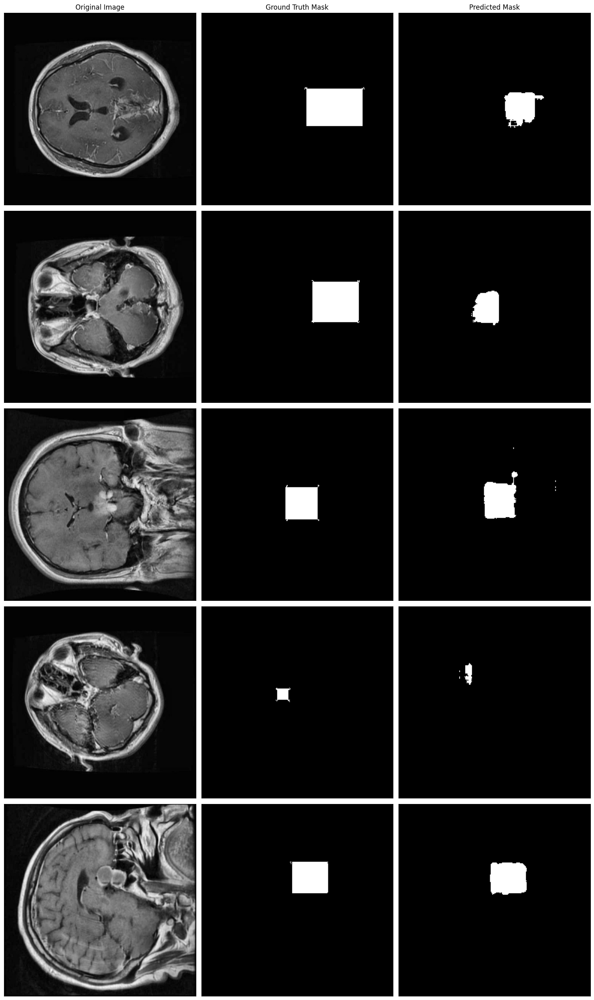

In [10]:
import matplotlib.pyplot as plt
import numpy as np
import random
test_mask_path = '/kaggle/working/test_masks/'
test_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
test_gen = DataGen(test_image_path, test_mask_path, test_annotations, 4, (256,256))
# Create figure
fig, axes = plt.subplots(5, 3, figsize=(15, 25))


# Get random batch indices
random_indices = random.sample(range(len(test_gen)), 5)

# Set column titles
titles = ['Original Image', 'Ground Truth Mask', 'Predicted Mask']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Plot images for each row
for row, idx in enumerate(random_indices):
    # Get image and mask from generator
    image, mask = test_gen[idx]
    
    # Get prediction
    pred = model.predict(image)
    pred = (pred[0] > 0.5).astype('int32')
    
    # Plot in columns
    axes[row, 0].imshow(image[0])  # Original
    axes[row, 1].imshow(mask[0].astype('int32'), cmap='gray')  # Mask
    axes[row, 2].imshow(pred, cmap='gray')  # Prediction
    
    # Remove axes ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


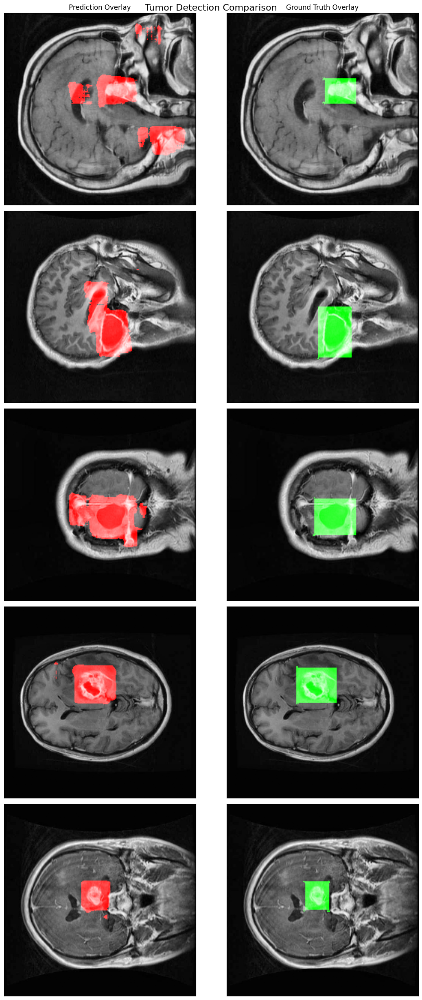

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import random
test_mask_path = '/kaggle/working/test_masks/'
test_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
test_gen = DataGen(test_image_path, test_mask_path, test_annotations, 4, (256,256))
# Create figure
fig, axes = plt.subplots(5, 2, figsize=(12, 25))
fig.suptitle('Tumor Detection Comparison', fontsize=16)

# Set column titles
titles = ['Prediction Overlay', 'Ground Truth Overlay']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Get random indices
random_indices = random.sample(range(len(test_gen)), 5)

# Plot overlaid images
for row, idx in enumerate(random_indices):
    # Get image and mask from generator
    image, true_mask = test_gen[idx]
    
    # Get prediction
    pred_mask = model.predict(image)
    pred_mask = (pred_mask[0] > 0.5).astype('float32')
    
    # Convert true mask to float for blending
    true_mask = true_mask[0].astype('float32')
    
    # Create overlays
    # Red overlay for predictions
    pred_overlay = image[0].copy()
    pred_overlay[..., 0] = np.maximum(pred_overlay[..., 0], pred_mask[..., 0] * 255)
    
    # Green overlay for ground truth
    truth_overlay = image[0].copy()
    truth_overlay[..., 1] = np.maximum(truth_overlay[..., 1], true_mask[..., 0] * 255)
    
    # Plot overlays
    axes[row, 0].imshow(pred_overlay)
    axes[row, 1].imshow(truth_overlay)
    
    # Remove axes ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()


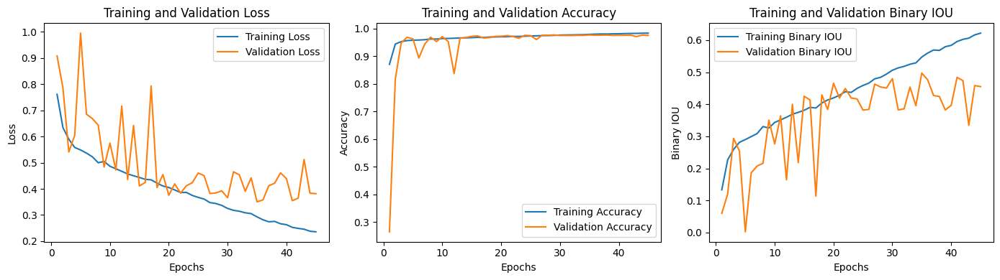

In [20]:
import matplotlib.pyplot as plt

# Assuming 'history' is the History object returned by model.fit()
def plot_training_history(history):
    # Extract metrics from the history object
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    binary_io_u_2 = history.history['binary_io_u']
    val_binary_io_u_2 = history.history['val_binary_io_u']

    epochs = range(1, len(loss) + 1)

    # Plot Loss
    plt.figure(figsize=(14, 4))
    plt.subplot(1, 3, 1)
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 3, 2)
    plt.plot(epochs, accuracy, label='Training Accuracy')
    plt.plot(epochs, val_accuracy, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot Binary IOU
    plt.subplot(1, 3, 3)
    plt.plot(epochs, binary_io_u_2, label='Training Binary IOU')
    plt.plot(epochs, val_binary_io_u_2, label='Validation Binary IOU')
    plt.title('Training and Validation Binary IOU')
    plt.xlabel('Epochs')
    plt.ylabel('Binary IOU')
    plt.legend()

    plt.tight_layout()
    plt.show()


# Call the function
plot_training_history(history)


In [21]:
model.save('modelo_256_256.h5')

## Segundo modelo
También 3 bloques convolucionales en el encoder y decoder, pero con 64, 128 y 256 filtros. El cuello de botella tiene 512 filtros

In [22]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.losses import dice
# Define the convolutional block
def convBlock(inputs, filters, dropout_rate=0):
    c1 = layers.Conv2D(filters, kernel_size=(3, 3), padding="same")(inputs)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.ReLU()(c1)
    c1 = layers.Dropout(dropout_rate)(c1)  # Dropout added

    c2 = layers.Conv2D(filters, kernel_size=(3, 3), padding="same")(c1)
    c2 = layers.BatchNormalization()(c2)
    c2 = layers.ReLU()(c2)
    c2 = layers.Dropout(dropout_rate)(c2)  # Dropout added

    return c2

# Define the encoder block
def encoderBlock(inputs, filters, dropout_rate=0):
    c = convBlock(inputs, filters, dropout_rate)
    m = layers.MaxPooling2D(strides=(2, 2))(c)
    return c, m

# Define the decoder block
def decoderBlock(inputs, skip, filters=64, dropout_rate=0):
    u = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding="same")(inputs)
    skip = layers.Concatenate()([u, skip])
    out = convBlock(skip, filters, dropout_rate)
    return out

# Define the U-Net model
def uNet(image_size):
    inputs = layers.Input(image_size)

    # Encoder with fewer filters
    skip1, encoder_1 = encoderBlock(inputs, 64, 0)  # Reduced filters
    skip2, encoder_2 = encoderBlock(encoder_1, 128, 0)
    skip3, encoder_3 = encoderBlock(encoder_2, 256, 0)

    # Bottleneck
    conv_block = convBlock(encoder_3, 512)

    # Decoder
    decoder_1 = decoderBlock(conv_block, skip3, 256, 0)
    decoder_2 = decoderBlock(decoder_1, skip2, 128, 0)
    decoder_3 = decoderBlock(decoder_2, skip1, 64, 0)

    # Output layer
    outputs = layers.Conv2D(1, 1, padding="same", activation="sigmoid")(decoder_3)

    model = models.Model(inputs, outputs)
    return model
input_shape = (256,256,3)
model = uNet(input_shape)
model.summary()
# Compile the model
from keras.losses import Dice
from keras.metrics import BinaryIoU
from tensorflow.keras.optimizers import Adam
binary_iou = tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)
model.compile(optimizer = Adam(),
              loss = Dice(),
              metrics=['accuracy',binary_iou])



Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_15[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_14 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_14          │ (None, 256, 256,  │          0 │ re_lu_14[0][0]    │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 256, 256,  │     36,928 │ dropout_14[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_16[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_15 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_15          │ (None, 256, 256,  │          0 │ re_lu_15[0][0]    │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 128, 128,  │          0 │ dropout_15[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_17 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_3[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_17[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_16 (ReLU)     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_16          │ (None, 128, 128,  │          0 │ re_lu_16[0][0]    │
│ (Dropout)           │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 128, 128,  │    147,584 │ dropout_16[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_18[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_17 (ReLU)     │ (None, 128, 128,  │          0 │ batch_normalizat

 Total params: 7,708,609 (29.41 MB)

 Trainable params: 7,702,977 (29.38 MB)

 Non-trainable params: 5,632 (22.00 KB)

In [23]:
import warnings
warnings.filterwarnings("ignore")

early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True, verbose=1)


train_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/train/'
train_mask_path = '/kaggle/working/train_masks/'
val_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/valid/'
val_mask_path = '/kaggle/working/val_masks/'
train_gen = DataGen(train_image_path, train_mask_path, train_annotations, 4, (256,256))
val_gen = DataGen(val_image_path, val_mask_path, val_annotations, 4, (256,256))

# Fit the model
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,  
    verbose=1,
    callbacks=[early_stopping]
)

Epoch 1/50


2024-12-13 11:10:34.746595: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.24577, expected 2.80959
2024-12-13 11:10:34.746656: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 179: 3.17396, expected 2.73778
2024-12-13 11:10:34.746963: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65536: 3.15611, expected 2.41005
2024-12-13 11:10:34.746987: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65537: 3.84262, expected 3.09657
2024-12-13 11:10:34.746999: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65538: 4.59187, expected 3.84581
2024-12-13 11:10:34.747013: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65539: 5.43123, expected 4.68518
2024-12-13 11:10:34.747027: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65540: 5.1009, expected 4.35484
2024-12-13 11:10:34.747042: E exte

376/376 ━━━━━━━━━━━━━━━━━━━━ 64s 101ms/step - accuracy: 0.7567 - binary_io_u_1: 0.1028 - loss: 0.8108 - val_accuracy: 0.9618 - val_binary_io_u_1: 2.3090e-04 - val_loss: 0.9980
Epoch 2/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - accuracy: 0.9361 - binary_io_u_1: 0.1967 - loss: 0.6753 - val_accuracy: 0.8341 - val_binary_io_u_1: 0.1361 - val_loss: 0.7625
Epoch 3/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - accuracy: 0.9482 - binary_io_u_1: 0.2376 - loss: 0.6178 - val_accuracy: 0.9476 - val_binary_io_u_1: 0.2788 - val_loss: 0.5707
Epoch 4/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - accuracy: 0.9536 - binary_io_u_1: 0.2632 - loss: 0.5807 - val_accuracy: 0.9647 - val_binary_io_u_1: 0.2379 - val_loss: 0.6214
Epoch 5/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - accuracy: 0.9555 - binary_io_u_1: 0.2842 - loss: 0.5532 - val_accuracy: 0.9542 - val_binary_io_u_1: 0.3159 - val_loss: 0.5262
Epoch 6/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - accuracy: 0.9594 - binary_io_u_1: 0.3023

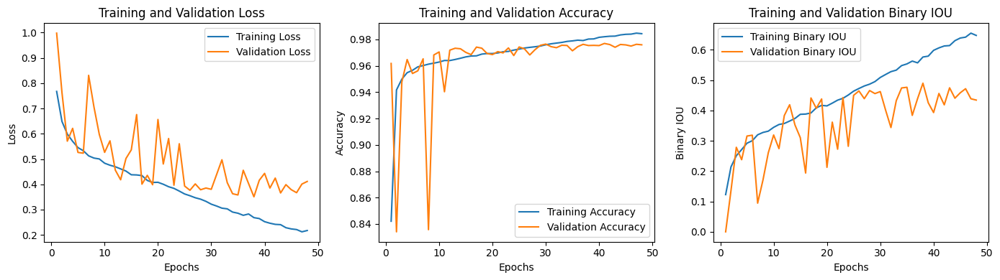

In [24]:
import matplotlib.pyplot as plt

# Assuming 'history' is the History object returned by model.fit()
def plot_training_history(history):
    # Extract metrics from the history object
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    binary_io_u_2 = history.history['binary_io_u_1']
    val_binary_io_u_2 = history.history['val_binary_io_u_1']

    epochs = range(1, len(loss) + 1)

    # Plot Loss
    plt.figure(figsize=(14, 4))
    plt.subplot(1, 3, 1)
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 3, 2)
    plt.plot(epochs, accuracy, label='Training Accuracy')
    plt.plot(epochs, val_accuracy, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot Binary IOU
    plt.subplot(1, 3, 3)
    plt.plot(epochs, binary_io_u_2, label='Training Binary IOU')
    plt.plot(epochs, val_binary_io_u_2, label='Validation Binary IOU')
    plt.title('Training and Validation Binary IOU')
    plt.xlabel('Epochs')
    plt.ylabel('Binary IOU')
    plt.legend()

    plt.tight_layout()
    plt.show()


# Call the function
plot_training_history(history)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


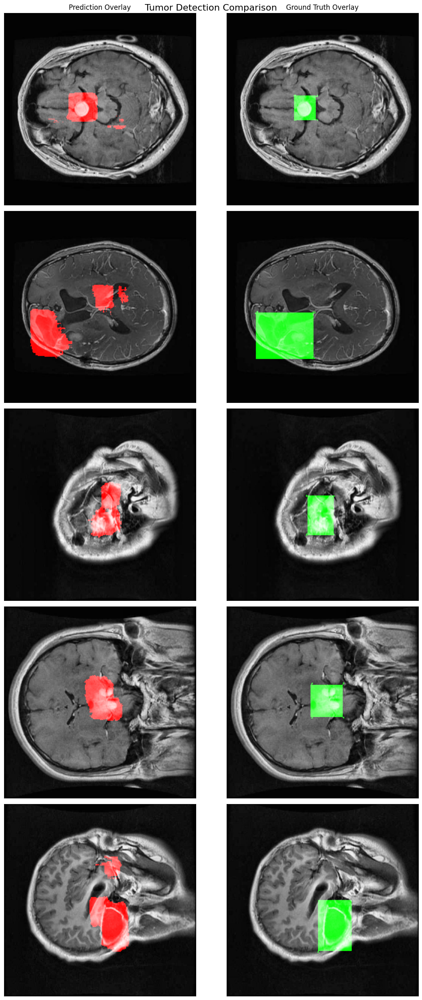

In [28]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Create figure
fig, axes = plt.subplots(5, 2, figsize=(12, 25))
fig.suptitle('Tumor Detection Comparison', fontsize=16)

# Set column titles
titles = ['Prediction Overlay', 'Ground Truth Overlay']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Get random indices
random_indices = random.sample(range(len(test_gen)), 5)

# Plot overlaid images
for row, idx in enumerate(random_indices):
    # Get image and mask from generator
    image, true_mask = test_gen[idx]
    
    # Get prediction
    pred_mask = model.predict(image)
    pred_mask = (pred_mask[0] > 0.5).astype('float32')
    
    # Convert true mask to float for blending
    true_mask = true_mask[0].astype('float32')
    
    # Create overlays
    # Red overlay for predictions
    pred_overlay = image[0].copy()
    pred_overlay[..., 0] = np.maximum(pred_overlay[..., 0], pred_mask[..., 0] * 255)
    
    # Green overlay for ground truth
    truth_overlay = image[0].copy()
    truth_overlay[..., 1] = np.maximum(truth_overlay[..., 1], true_mask[..., 0] * 255)
    
    # Plot overlays
    axes[row, 0].imshow(pred_overlay)
    axes[row, 1].imshow(truth_overlay)
    
    # Remove axes ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()


In [29]:
model.save('model_512_256.h5')

## Tercer modelo
Este modelo tiene 4 bloques en el encoder y en el decoder con 64, 128, 256 y 528 filtros. El cuello de botella tiene 1028 filtros

In [30]:
import tensorflow as tf
from tensorflow.keras import layers, models
from keras.losses import Dice
def convBlock(inputs, filters, dropout_rate=0.0):
    c = layers.Conv2D(filters, kernel_size=(3, 3), padding="same", kernel_initializer='he_normal')(inputs)
    c = layers.BatchNormalization()(c)
    c = layers.ReLU()(c)
    if dropout_rate > 0:
        c = layers.Dropout(dropout_rate)(c)

    c = layers.Conv2D(filters, kernel_size=(3, 3), padding="same", kernel_initializer='he_normal')(c)
    c = layers.BatchNormalization()(c)
    c = layers.ReLU()(c)
    if dropout_rate > 0:
        c = layers.Dropout(dropout_rate)(c)
    return c

def encoderBlock(inputs, filters, dropout_rate=0.0):
    c = convBlock(inputs, filters, dropout_rate)
    m = layers.MaxPooling2D((2, 2))(c)
    return c, m

def decoderBlock(inputs, skip, filters, dropout_rate=0.0):
    u = layers.Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding="same")(inputs)
    u = layers.Concatenate()([u, skip])
    c = convBlock(u, filters, dropout_rate)
    return c

def uNet(image_size):
    inputs = layers.Input(image_size)

    # Encoder
    skip1, encoder_1 = encoderBlock(inputs, 64, dropout_rate=0)   # Level 1
    skip2, encoder_2 = encoderBlock(encoder_1, 128, dropout_rate=0) # Level 2
    skip3, encoder_3 = encoderBlock(encoder_2, 256, dropout_rate=0) # Level 3
    skip4, encoder_4 = encoderBlock(encoder_3, 512, dropout_rate=0) # Level 4

    # Bottleneck
    bottleneck = convBlock(encoder_4, 1024, dropout_rate=0)

    # Decoder
    decoder_4 = decoderBlock(bottleneck, skip4, 512, dropout_rate=0)
    decoder_3 = decoderBlock(decoder_4, skip3, 256, dropout_rate=0)
    decoder_2 = decoderBlock(decoder_3, skip2, 128, dropout_rate=0)
    decoder_1 = decoderBlock(decoder_2, skip1, 64, dropout_rate=0)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(decoder_1)

    model = models.Model(inputs, outputs)
    return model

input_shape = (256,256,3)
model = uNet(input_shape)

# Compile model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=Dice(),
    metrics=['accuracy', tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)]
)
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_30 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_30[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_28 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_31 (Conv2D)  │ (None, 256, 256,  │     36,928 │ re_lu_28[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_31[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_29 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 128, 128,  │          0 │ re_lu_29[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_32 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_6[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_32[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_30 (ReLU)     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_33 (Conv2D)  │ (None, 128, 128,  │    147,584 │ re_lu_30[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_33[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_31 (ReLU)     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_7     │ (None, 64, 64,    │          0 │ re_lu_31[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_34 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_7[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │      1,024 │ conv2d_34[0][0] 

 Total params: 31,055,297 (118.47 MB)

 Trainable params: 31,043,521 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [31]:
import warnings
warnings.filterwarnings("ignore")

early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True, verbose=1)


train_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/train/'
train_mask_path = '/kaggle/working/train_masks/'
val_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/valid/'
val_mask_path = '/kaggle/working/val_masks/'
train_gen = DataGen(train_image_path, train_mask_path, train_annotations, 4, (256,256))
val_gen = DataGen(val_image_path, val_mask_path, val_annotations, 4, (256,256))

# Fit the model
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,  
    verbose=1,
    callbacks=[early_stopping]
)

Epoch 1/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 70s 131ms/step - accuracy: 0.6844 - binary_io_u_2: 0.1006 - loss: 0.8338 - val_accuracy: 0.7226 - val_binary_io_u_2: 0.1162 - val_loss: 0.8151
Epoch 2/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - accuracy: 0.9234 - binary_io_u_2: 0.2439 - loss: 0.6920 - val_accuracy: 0.9353 - val_binary_io_u_2: 0.2427 - val_loss: 0.6743
Epoch 3/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - accuracy: 0.9469 - binary_io_u_2: 0.2987 - loss: 0.6003 - val_accuracy: 0.9676 - val_binary_io_u_2: 0.3818 - val_loss: 0.5155
Epoch 4/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - accuracy: 0.9583 - binary_io_u_2: 0.3396 - loss: 0.5368 - val_accuracy: 0.9347 - val_binary_io_u_2: 0.3283 - val_loss: 0.5285
Epoch 5/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - accuracy: 0.9609 - binary_io_u_2: 0.3504 - loss: 0.5063 - val_accuracy: 0.9723 - val_binary_io_u_2: 0.3573 - val_loss: 0.5121
Epoch 6/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - accuracy: 0.9653 - binary_io

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


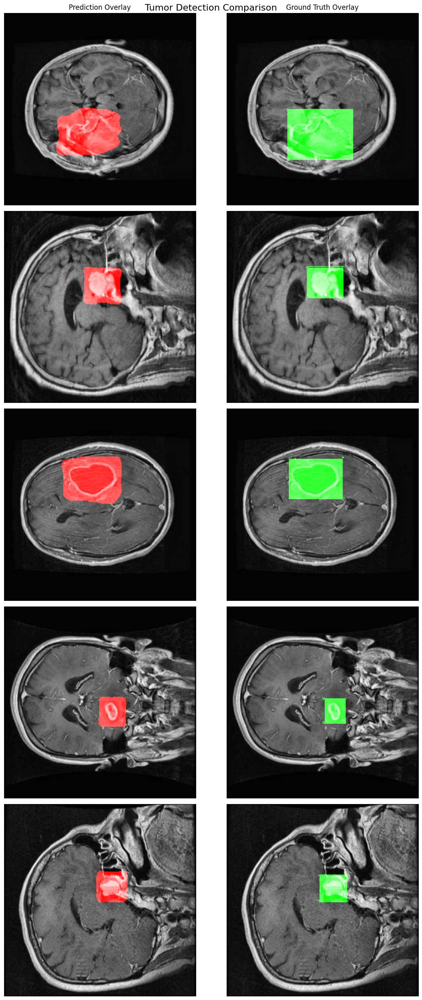

In [35]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Create figure
fig, axes = plt.subplots(5, 2, figsize=(12, 25))
fig.suptitle('Tumor Detection Comparison', fontsize=16)

# Set column titles
titles = ['Prediction Overlay', 'Ground Truth Overlay']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Get random indices
random_indices = random.sample(range(len(test_gen)), 5)

# Plot overlaid images
for row, idx in enumerate(random_indices):
    # Get image and mask from generator
    image, true_mask = test_gen[idx]
    
    # Get prediction
    pred_mask = model.predict(image)
    pred_mask = (pred_mask[0] > 0.5).astype('float32')
    
    # Convert true mask to float for blending
    true_mask = true_mask[0].astype('float32')
    
    # Create overlays
    # Red overlay for predictions
    pred_overlay = image[0].copy()
    pred_overlay[..., 0] = np.maximum(pred_overlay[..., 0], pred_mask[..., 0] * 255)
    
    # Green overlay for ground truth
    truth_overlay = image[0].copy()
    truth_overlay[..., 1] = np.maximum(truth_overlay[..., 1], true_mask[..., 0] * 255)
    
    # Plot overlays
    axes[row, 0].imshow(pred_overlay)
    axes[row, 1].imshow(truth_overlay)
    
    # Remove axes ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()


In [36]:
model.save('model_1024_256.h5')

## Cuarto modelo
Este modelo es igual que el tercero, sin embargo, tiene un dropout de 0.3 en el cuello de botella.

In [37]:
import tensorflow as tf
from tensorflow.keras import layers, models
from keras.losses import Dice
def convBlock(inputs, filters, dropout_rate=0.0):
    c = layers.Conv2D(filters, kernel_size=(3, 3), padding="same", kernel_initializer='he_normal')(inputs)
    c = layers.BatchNormalization()(c)
    c = layers.ReLU()(c)
    if dropout_rate > 0:
        c = layers.Dropout(dropout_rate)(c)

    c = layers.Conv2D(filters, kernel_size=(3, 3), padding="same", kernel_initializer='he_normal')(c)
    c = layers.BatchNormalization()(c)
    c = layers.ReLU()(c)
    if dropout_rate > 0:
        c = layers.Dropout(dropout_rate)(c)
    return c

def encoderBlock(inputs, filters, dropout_rate=0.0):
    c = convBlock(inputs, filters, dropout_rate)
    m = layers.MaxPooling2D((2, 2))(c)
    return c, m

def decoderBlock(inputs, skip, filters, dropout_rate=0.0):
    u = layers.Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding="same")(inputs)
    u = layers.Concatenate()([u, skip])
    c = convBlock(u, filters, dropout_rate)
    return c

def uNet(image_size):
    inputs = layers.Input(image_size)

    # Encoder
    skip1, encoder_1 = encoderBlock(inputs, 64, dropout_rate=0)   # Level 1
    skip2, encoder_2 = encoderBlock(encoder_1, 128, dropout_rate=0) # Level 2
    skip3, encoder_3 = encoderBlock(encoder_2, 256, dropout_rate=0) # Level 3
    skip4, encoder_4 = encoderBlock(encoder_3, 512, dropout_rate=0) # Level 4

    # Bottleneck
    bottleneck = convBlock(encoder_4, 1024, dropout_rate=0.3)

    # Decoder
    decoder_4 = decoderBlock(bottleneck, skip4, 512, dropout_rate=0)
    decoder_3 = decoderBlock(decoder_4, skip3, 256, dropout_rate=0)
    decoder_2 = decoderBlock(decoder_3, skip2, 128, dropout_rate=0)
    decoder_1 = decoderBlock(decoder_2, skip1, 64, dropout_rate=0)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(decoder_1)

    model = models.Model(inputs, outputs)
    return model

input_shape = (256,256,3)
model = uNet(input_shape)

# Compile model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=Dice(),
    metrics=['accuracy', tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)]
)
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_49 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_3[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_49[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_46 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_50 (Conv2D)  │ (None, 256, 256,  │     36,928 │ re_lu_46[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_50[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_47 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_10    │ (None, 128, 128,  │          0 │ re_lu_47[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_51 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_10… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_51[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_48 (ReLU)     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_52 (Conv2D)  │ (None, 128, 128,  │    147,584 │ re_lu_48[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_52[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_49 (ReLU)     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_11    │ (None, 64, 64,    │          0 │ re_lu_49[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_53 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_11… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │      1,024 │ conv2d_53[0][0] 

 Total params: 31,055,297 (118.47 MB)

 Trainable params: 31,043,521 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [38]:
import warnings
warnings.filterwarnings("ignore")

early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True, verbose=1)


train_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/train/'
train_mask_path = '/kaggle/working/train_masks/'
val_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/valid/'
val_mask_path = '/kaggle/working/val_masks/'
train_gen = DataGen(train_image_path, train_mask_path, train_annotations, 4, (256,256))
val_gen = DataGen(val_image_path, val_mask_path, val_annotations, 4, (256,256))

# Fit the model
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,  
    verbose=1,
    callbacks=[early_stopping]
)

Epoch 1/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 70s 130ms/step - accuracy: 0.6981 - binary_io_u_3: 0.1041 - loss: 0.8289 - val_accuracy: 0.4741 - val_binary_io_u_3: 0.0667 - val_loss: 0.8783
Epoch 2/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - accuracy: 0.9266 - binary_io_u_3: 0.2536 - loss: 0.6816 - val_accuracy: 0.9507 - val_binary_io_u_3: 0.3159 - val_loss: 0.6257
Epoch 3/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - accuracy: 0.9499 - binary_io_u_3: 0.2982 - loss: 0.6084 - val_accuracy: 0.9058 - val_binary_io_u_3: 0.2507 - val_loss: 0.6285
Epoch 4/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - accuracy: 0.9572 - binary_io_u_3: 0.3380 - loss: 0.5361 - val_accuracy: 0.9676 - val_binary_io_u_3: 0.2377 - val_loss: 0.6723
Epoch 5/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - accuracy: 0.9615 - binary_io_u_3: 0.3551 - loss: 0.5004 - val_accuracy: 0.9691 - val_binary_io_u_3: 0.4183 - val_loss: 0.4469
Epoch 6/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - accuracy: 0.9634 - binary_io

In [39]:
model.save('model_1024_256_dropout03.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


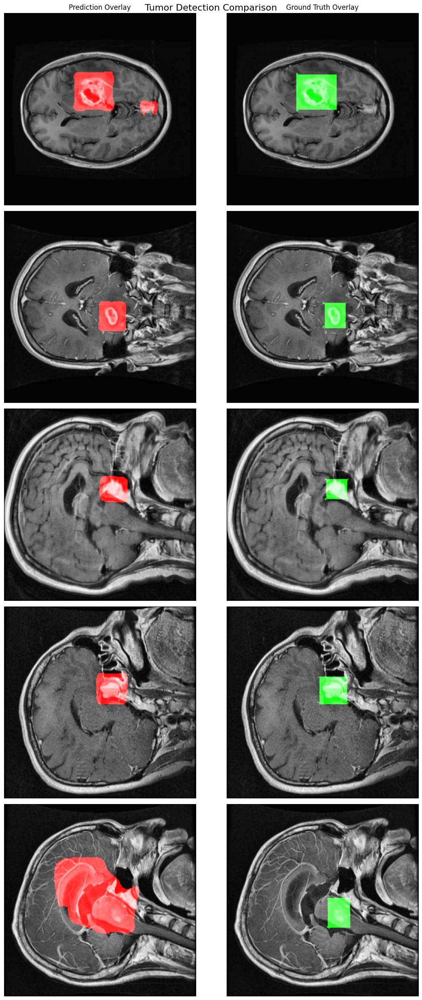

In [34]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Create figure
fig, axes = plt.subplots(5, 2, figsize=(12, 25))
fig.suptitle('Tumor Detection Comparison', fontsize=16)

# Set column titles
titles = ['Prediction Overlay', 'Ground Truth Overlay']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Get random indices
random_indices = random.sample(range(len(test_gen)), 5)

# Plot overlaid images
for row, idx in enumerate(random_indices):
    # Get image and mask from generator
    image, true_mask = test_gen[idx]
    
    # Get prediction
    pred_mask = model.predict(image)
    pred_mask = (pred_mask[0] > 0.5).astype('float32')
    
    # Convert true mask to float for blending
    true_mask = true_mask[0].astype('float32')
    
    # Create overlays
    # Red overlay for predictions
    pred_overlay = image[0].copy()
    pred_overlay[..., 0] = np.maximum(pred_overlay[..., 0], pred_mask[..., 0] * 255)
    
    # Green overlay for ground truth
    truth_overlay = image[0].copy()
    truth_overlay[..., 1] = np.maximum(truth_overlay[..., 1], true_mask[..., 0] * 255)
    
    # Plot overlays
    axes[row, 0].imshow(pred_overlay)
    axes[row, 1].imshow(truth_overlay)
    
    # Remove axes ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()


# Pruebas

In [15]:
import tensorflow as tf
from tensorflow.keras.utils import Sequence
import numpy as np
import cv2

class DataGenAug(Sequence):
    def __init__(self, image_path, mask_path, annotations, batch_size, target_size=(512, 512), augment=True):
        self.image_path = image_path
        self.mask_path = mask_path
        self.annotations = annotations
        self.batch_size = batch_size
        self.target_size = target_size
        self.augment = augment  # Flag to apply augmentation

        # Augmentation parameters
        self.aug_params = {
            'rotation_range': 0.2,
            'width_shift_range': 0.05,
            'height_shift_range': 0.05,
            'shear_range': 0.05,
            'zoom_range': 0.05,
            'horizontal_flip': True,
            'fill_mode': 'nearest'
        }

    def __len__(self):
        return int(np.ceil(len(self.annotations['images']) / self.batch_size))

    def __getitem__(self, index):
        image_batch = np.zeros((self.batch_size, self.target_size[0], self.target_size[1], 3), dtype='float32')
        mask_batch = np.zeros((self.batch_size, self.target_size[0], self.target_size[1], 1), dtype='float32')

        start = self.batch_size * index
        end = min(self.batch_size * (index + 1), len(self.annotations['images']))
        idx = 0

        for i in range(start, end):
            # Load and preprocess image
            img_path = self.image_path + self.annotations['images'][i]['file_name']
            image = cv2.imread(img_path)
            image = cv2.resize(image, self.target_size)
            image = image / 255.0  # Normalize to [0, 1]

            # Load and preprocess mask
            mask_path = self.mask_path + self.annotations['images'][i]['file_name']
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            mask = cv2.resize(mask, self.target_size)
            mask = np.expand_dims(mask, axis=-1)
            mask = (mask > 0.5).astype('float32')  # Binarize mask

            if self.augment:
                # Combine image and mask for simultaneous transformation
                seed = np.random.randint(0, 100000)

                # Apply augmentations to image
                image = self.apply_augmentation(image, seed)

                # Apply the same augmentations to mask
                mask = self.apply_augmentation(mask, seed, is_mask=True)

            image_batch[idx] = image
            mask_batch[idx] = mask
            idx += 1

        return image_batch, mask_batch

    def apply_augmentation(self, img, seed, is_mask=False):
        img = tf.keras.preprocessing.image.random_rotation(
            img,
            self.aug_params['rotation_range'] * 100,
            row_axis=0,
            col_axis=1,
            channel_axis=2,
            fill_mode=self.aug_params['fill_mode'],
            cval=0.0,
            interpolation_order=1
        )
        img = tf.keras.preprocessing.image.random_shift(
            img,
            self.aug_params['width_shift_range'],
            self.aug_params['height_shift_range'],
            row_axis=0,
            col_axis=1,
            channel_axis=2,
            fill_mode=self.aug_params['fill_mode'],
            cval=0.0,
            interpolation_order=1
        )
        img = tf.keras.preprocessing.image.random_shear(
            img,
            self.aug_params['shear_range'] * 100,
            row_axis=0,
            col_axis=1,
            channel_axis=2,
            fill_mode=self.aug_params['fill_mode'],
            cval=0.0,
            interpolation_order=1
        )
        img = tf.keras.preprocessing.image.random_zoom(
            img,
            (1 - self.aug_params['zoom_range'], 1 + self.aug_params['zoom_range']),
            row_axis=0,
            col_axis=1,
            channel_axis=2,
            fill_mode=self.aug_params['fill_mode'],
            cval=0.0,
            interpolation_order=1
        )
        if self.aug_params['horizontal_flip']:
            img = tf.image.random_flip_left_right(img)

        # Ensure masks remain binary after transformations
        if is_mask:
            img = tf.where(img > 0.5, 1.0, 0.0)

        return img.numpy()

In [20]:
import tensorflow as tf
from tensorflow.keras import layers, models
from keras.losses import Dice
def convBlock(inputs, filters, dropout_rate=0.0):
    c = layers.Conv2D(filters, kernel_size=(3, 3), padding="same", kernel_initializer='he_normal')(inputs)
    c = layers.BatchNormalization()(c)
    c = layers.ReLU()(c)
    if dropout_rate > 0:
        c = layers.Dropout(dropout_rate)(c)

    c = layers.Conv2D(filters, kernel_size=(3, 3), padding="same", kernel_initializer='he_normal')(c)
    c = layers.BatchNormalization()(c)
    c = layers.ReLU()(c)
    if dropout_rate > 0:
        c = layers.Dropout(dropout_rate)(c)
    return c

def encoderBlock(inputs, filters, dropout_rate=0.0):
    c = convBlock(inputs, filters, dropout_rate)
    m = layers.MaxPooling2D((2, 2))(c)
    return c, m

def decoderBlock(inputs, skip, filters, dropout_rate=0.0):
    u = layers.Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding="same")(inputs)
    u = layers.Concatenate()([u, skip])
    c = convBlock(u, filters, dropout_rate)
    return c

def uNet(image_size):
    inputs = layers.Input(image_size)

    # Encoder
    skip1, encoder_1 = encoderBlock(inputs, 64, dropout_rate=0)   # Level 1
    skip2, encoder_2 = encoderBlock(encoder_1, 128, dropout_rate=0) # Level 2
    skip3, encoder_3 = encoderBlock(encoder_2, 256, dropout_rate=0) # Level 3
    skip4, encoder_4 = encoderBlock(encoder_3, 512, dropout_rate=0) # Level 4

    # Bottleneck
    bottleneck = convBlock(encoder_4, 1024, dropout_rate=0)

    # Decoder
    decoder_4 = decoderBlock(bottleneck, skip4, 512, dropout_rate=0)
    decoder_3 = decoderBlock(decoder_4, skip3, 256, dropout_rate=0)
    decoder_2 = decoderBlock(decoder_3, skip2, 128, dropout_rate=0)
    decoder_1 = decoderBlock(decoder_2, skip1, 64, dropout_rate=0)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(decoder_1)

    model = models.Model(inputs, outputs)
    return model

input_shape = (256,256,3)
model = uNet(input_shape)

# Compile model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=Dice(),
    metrics=['accuracy', tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)]
)
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_38 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_38[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_36 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_39 (Conv2D)  │ (None, 256, 256,  │     36,928 │ re_lu_36[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_39[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_37 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 128, 128,  │          0 │ re_lu_37[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_40 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_8[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_40[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_38 (ReLU)     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_41 (Conv2D)  │ (None, 128, 128,  │    147,584 │ re_lu_38[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_41[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_39 (ReLU)     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 64, 64,    │          0 │ re_lu_39[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_42 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_9[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │      1,024 │ conv2d_42[0][0] 

 Total params: 31,055,297 (118.47 MB)

 Trainable params: 31,043,521 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [21]:
import warnings
from keras.callbacks import EarlyStopping
warnings.filterwarnings("ignore")

early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True, verbose=1)


train_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/train/'
train_mask_path = '/kaggle/working/train_masks/'
val_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/valid/'
val_mask_path = '/kaggle/working/val_masks/'
train_gen = DataGenAug(train_image_path, train_mask_path, train_annotations, 4, (256,256))
val_gen = DataGen(val_image_path, val_mask_path, val_annotations, 4, (256,256))

# Fit the model
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,  
    verbose=1,
    callbacks=[early_stopping]
)

Epoch 1/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 142s 327ms/step - accuracy: 0.7596 - binary_io_u_2: 0.1039 - loss: 0.8248 - val_accuracy: 0.8469 - val_binary_io_u_2: 0.1552 - val_loss: 0.7556
Epoch 2/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 123s 322ms/step - accuracy: 0.8970 - binary_io_u_2: 0.1715 - loss: 0.7354 - val_accuracy: 0.7962 - val_binary_io_u_2: 0.1336 - val_loss: 0.7716
Epoch 3/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 123s 322ms/step - accuracy: 0.9084 - binary_io_u_2: 0.1852 - loss: 0.7056 - val_accuracy: 0.8940 - val_binary_io_u_2: 0.1830 - val_loss: 0.7058
Epoch 4/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 123s 322ms/step - accuracy: 0.9203 - binary_io_u_2: 0.1925 - loss: 0.6919 - val_accuracy: 0.9571 - val_binary_io_u_2: 0.1982 - val_loss: 0.6920
Epoch 5/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 123s 322ms/step - accuracy: 0.9266 - binary_io_u_2: 0.1989 - loss: 0.6773 - val_accuracy: 0.8779 - val_binary_io_u_2: 0.1937 - val_loss: 0.6808
Epoch 6/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 123s 323ms/step - accuracy: 0.9255 - bin

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


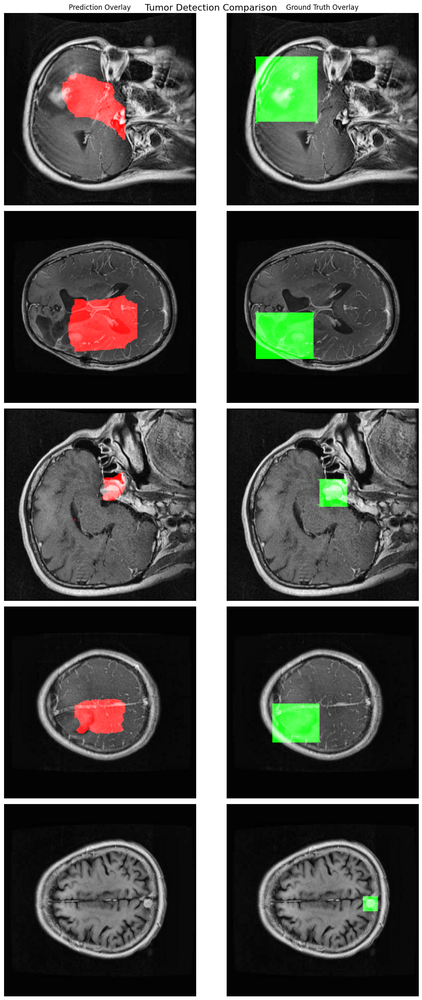

In [23]:
import matplotlib.pyplot as plt
import numpy as np
import random
test_mask_path = '/kaggle/working/test_masks/'
test_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
test_gen = DataGen(test_image_path, test_mask_path, test_annotations, 4, (256,256))
# Create figure
fig, axes = plt.subplots(5, 2, figsize=(12, 25))
fig.suptitle('Tumor Detection Comparison', fontsize=16)

# Set column titles
titles = ['Prediction Overlay', 'Ground Truth Overlay']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Get random indices
random_indices = random.sample(range(len(test_gen)), 5)

# Plot overlaid images
for row, idx in enumerate(random_indices):
    # Get image and mask from generator
    image, true_mask = test_gen[idx]
    
    # Get prediction
    pred_mask = model.predict(image)
    pred_mask = (pred_mask[0] > 0.5).astype('float32')
    
    # Convert true mask to float for blending
    true_mask = true_mask[0].astype('float32')
    
    # Create overlays
    # Red overlay for predictions
    pred_overlay = image[0].copy()
    pred_overlay[..., 0] = np.maximum(pred_overlay[..., 0], pred_mask[..., 0] * 255)
    
    # Green overlay for ground truth
    truth_overlay = image[0].copy()
    truth_overlay[..., 1] = np.maximum(truth_overlay[..., 1], true_mask[..., 0] * 255)
    
    # Plot overlays
    axes[row, 0].imshow(pred_overlay)
    axes[row, 1].imshow(truth_overlay)
    
    # Remove axes ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()


In [11]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.losses import dice
# Define the convolutional block
def convBlock(inputs, filters, dropout_rate=0):
    c1 = layers.Conv2D(filters, kernel_size=(3, 3), padding="same")(inputs)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.ReLU()(c1)
    c1 = layers.Dropout(dropout_rate)(c1)  # Dropout added

    c2 = layers.Conv2D(filters, kernel_size=(3, 3), padding="same")(c1)
    c2 = layers.BatchNormalization()(c2)
    c2 = layers.ReLU()(c2)
    c2 = layers.Dropout(dropout_rate)(c2)  # Dropout added

    return c2

# Define the encoder block
def encoderBlock(inputs, filters, dropout_rate=0):
    c = convBlock(inputs, filters, dropout_rate)
    m = layers.MaxPooling2D(strides=(2, 2))(c)
    return c, m

# Define the decoder block
def decoderBlock(inputs, skip, filters=64, dropout_rate=0):
    u = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding="same")(inputs)
    skip = layers.Concatenate()([u, skip])
    out = convBlock(skip, filters, dropout_rate)
    return out

# Define the U-Net model
def uNet(image_size):
    inputs = layers.Input(image_size)

    # Encoder with fewer filters
    skip1, encoder_1 = encoderBlock(inputs, 32, 0.3)  # Reduced filters
    skip2, encoder_2 = encoderBlock(encoder_1, 64, 0.2)
    skip3, encoder_3 = encoderBlock(encoder_2, 128, 0)

    # Bottleneck
    conv_block = convBlock(encoder_3, 256)

    # Decoder
    decoder_1 = decoderBlock(conv_block, skip3, 128, 0)
    decoder_2 = decoderBlock(decoder_1, skip2, 64, 0.2)
    decoder_3 = decoderBlock(decoder_2, skip1, 32, 0.3)

    # Output layer
    outputs = layers.Conv2D(1, 1, padding="same", activation="sigmoid")(decoder_3)

    model = models.Model(inputs, outputs)
    return model
input_shape = (512,512,3)
model = uNet(input_shape)
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 512, 512,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 512, 512,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 512, 512,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 512, 512,  │          0 │ re_lu[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 512, 512,  │      9,248 │ dropout[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 512, 512,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 512, 512,  │          0 │ re_lu_1[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 256, 256,  │          0 │ dropout_1[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 256, 256,  │          0 │ re_lu_2[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 256, 256,  │     36,928 │ dropout_2[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 256, 256,  │          0 │ batch_normalizat

 Total params: 1,931,233 (7.37 MB)

 Trainable params: 1,928,417 (7.36 MB)

 Non-trainable params: 2,816 (11.00 KB)

In [12]:
# Compile the model
from keras.losses import Dice
from keras.metrics import BinaryIoU
from tensorflow.keras.optimizers import Adam
binary_iou = tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)
model.compile(optimizer = Adam(),
              loss = Dice(),
              metrics=['accuracy',binary_iou])



In [14]:
import warnings
warnings.filterwarnings("ignore")

early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True, verbose=1)
model_checkpoint = ModelCheckpoint(
    "model_dropout_512.keras",
    monitor='val_binary_io_u',   
    save_best_only=True,
    save_weights_only=False,
    verbose=1,
    mode='max'
)

train_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/train/'
train_mask_path = '/kaggle/working/train_masks/'
val_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/valid/'
val_mask_path = '/kaggle/working/val_masks/'
train_gen = DataGen(train_image_path, train_mask_path, train_annotations, 4)
val_gen = DataGen(val_image_path, val_mask_path, val_annotations, 4)

# Fit the model
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,  
    verbose=1,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/50


2024-12-05 16:55:40.902244: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.28217, expected 2.80856
2024-12-05 16:55:40.902310: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 20: 3.65984, expected 3.18622
2024-12-05 16:55:40.902325: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 146: 3.18374, expected 2.71012
2024-12-05 16:55:40.902340: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 289: 3.72308, expected 3.24946
2024-12-05 16:55:40.902355: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 467: 3.36379, expected 2.89017
2024-12-05 16:55:40.902403: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6144: 3.64194, expected 3.16832
2024-12-05 16:55:40.902784: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 56320: 3.51982, expected 3.0462
2024-12-05 16:55:40.902940: E external/loc

  1/376 ━━━━━━━━━━━━━━━━━━━━ 4:39:04 45s/step - accuracy: 0.3294 - binary_io_u_1: 0.0506 - loss: 0.9079

I0000 00:00:1733417768.248851     112 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


376/376 ━━━━━━━━━━━━━━━━━━━━ 108s 168ms/step - accuracy: 0.6535 - binary_io_u_1: 0.1989 - loss: 0.8645 - val_accuracy: 0.9614 - val_binary_io_u_1: 0.0029 - val_loss: 0.9860
Epoch 2/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 61s 162ms/step - accuracy: 0.8467 - binary_io_u_1: 0.1585 - loss: 0.8058 - val_accuracy: 0.9462 - val_binary_io_u_1: 0.0394 - val_loss: 0.9391
Epoch 3/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 61s 161ms/step - accuracy: 0.8823 - binary_io_u_1: 0.1581 - loss: 0.7665 - val_accuracy: 0.9619 - val_binary_io_u_1: 0.0013 - val_loss: 0.9971
Epoch 4/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 61s 161ms/step - accuracy: 0.9331 - binary_io_u_1: 0.1772 - loss: 0.7031 - val_accuracy: 0.9622 - val_binary_io_u_1: 0.0597 - val_loss: 0.8861
Epoch 5/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 61s 161ms/step - accuracy: 0.9363 - binary_io_u_1: 0.1994 - loss: 0.6706 - val_accuracy: 0.9625 - val_binary_io_u_1: 0.0186 - val_loss: 0.9638
Epoch 6/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 61s 161ms/step - accuracy: 0.9488 - binary_io_u_1: 0.22

In [16]:
history.history.keys()

dict_keys(['accuracy', 'binary_io_u_1', 'loss', 'val_accuracy', 'val_binary_io_u_1', 'val_loss'])

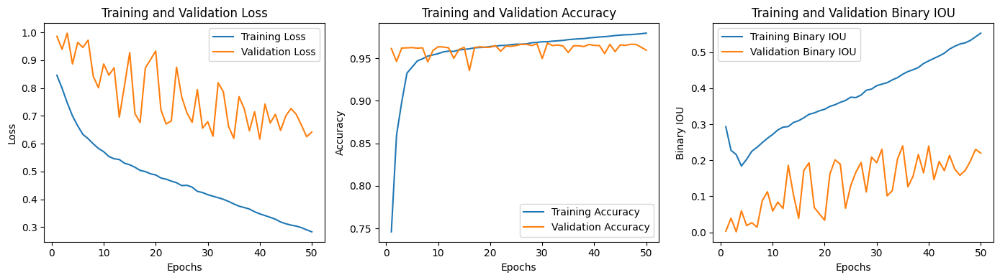

In [17]:
import matplotlib.pyplot as plt

# Assuming 'history' is the History object returned by model.fit()
def plot_training_history(history):
    # Extract metrics from the history object
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    binary_io_u_2 = history.history['binary_io_u_1']
    val_binary_io_u_2 = history.history['val_binary_io_u_1']

    epochs = range(1, len(loss) + 1)

    # Plot Loss
    plt.figure(figsize=(14, 4))
    plt.subplot(1, 3, 1)
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 3, 2)
    plt.plot(epochs, accuracy, label='Training Accuracy')
    plt.plot(epochs, val_accuracy, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot Binary IOU
    plt.subplot(1, 3, 3)
    plt.plot(epochs, binary_io_u_2, label='Training Binary IOU')
    plt.plot(epochs, val_binary_io_u_2, label='Validation Binary IOU')
    plt.title('Training and Validation Binary IOU')
    plt.xlabel('Epochs')
    plt.ylabel('Binary IOU')
    plt.legend()

    plt.tight_layout()
    plt.show()


# Call the function
plot_training_history(history)


In [25]:
test_mask_path = '/kaggle/working/test_masks/'
test_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
test_gen = DataGen(test_image_path, test_mask_path, test_annotations, 4)
import tensorflow as tf
import numpy as np

import tensorflow as tf
import numpy as np

def calculate_test_iou(test_gen, model):
    # Initialize metric
    binary_iou = tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)
    
    # Process all batches
    num_batches = len(test_gen)
    for i in range(num_batches):
        # Get batch of images and masks
        images, true_masks = test_gen[i]
        
        # Generate predictions
        pred_masks = model.predict(images, verbose=0)
        
        # Update IoU metric
        binary_iou.update_state(y_true=true_masks, y_pred=pred_masks)
        
        # Print progress
        if (i + 1) % 10 == 0:
            print(f"Processed {i+1}/{num_batches} batches")
    
    # Calculate final IoU
    test_iou = binary_iou.result().numpy()
    print(f"\nTest IoU: {test_iou:.4f}")
    return test_iou

test_iou = calculate_test_iou(test_gen, model)

Processed 10/54 batches
Processed 20/54 batches
Processed 30/54 batches
Processed 40/54 batches
Processed 50/54 batches

Test IoU: 0.2282


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


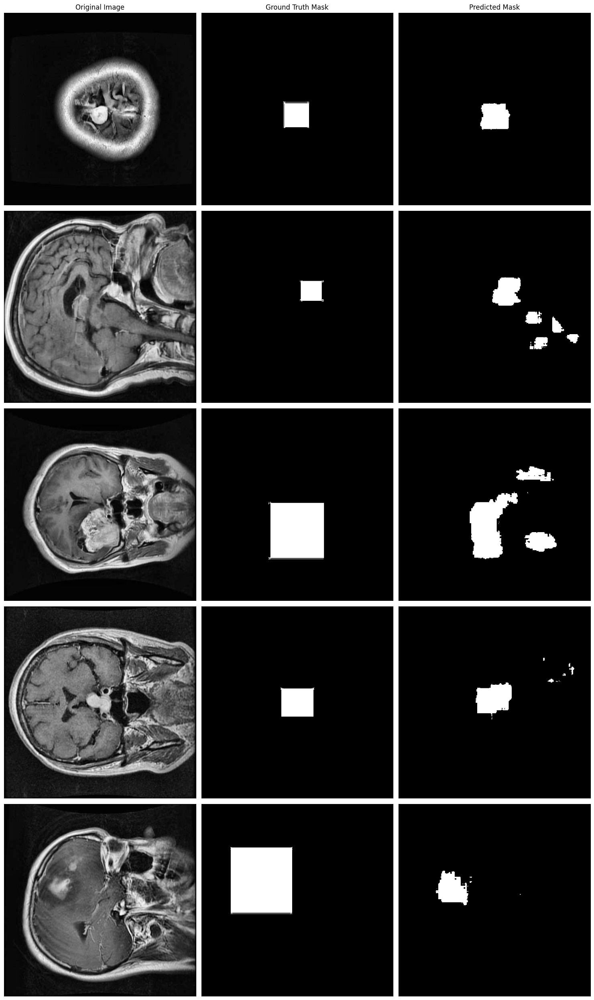

In [26]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Create figure
fig, axes = plt.subplots(5, 3, figsize=(15, 25))


# Get random batch indices
random_indices = random.sample(range(len(test_gen)), 5)

# Set column titles
titles = ['Original Image', 'Ground Truth Mask', 'Predicted Mask']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Plot images for each row
for row, idx in enumerate(random_indices):
    # Get image and mask from generator
    image, mask = test_gen[idx]
    
    # Get prediction
    pred = model.predict(image)
    pred = (pred[0] > 0.5).astype('int32')
    
    # Plot in columns
    axes[row, 0].imshow(image[0])  # Original
    axes[row, 1].imshow(mask[0].astype('int32'), cmap='gray')  # Mask
    axes[row, 2].imshow(pred, cmap='gray')  # Prediction
    
    # Remove axes ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


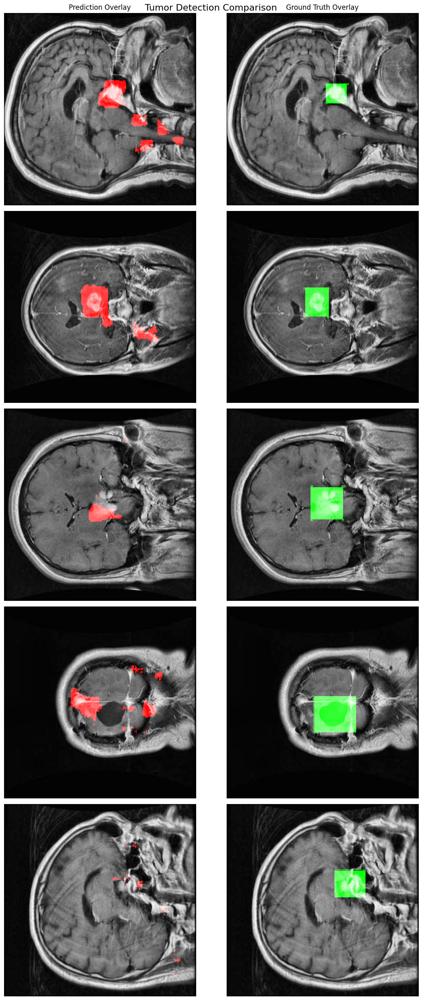

In [31]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Create figure
fig, axes = plt.subplots(5, 2, figsize=(12, 25))
fig.suptitle('Tumor Detection Comparison', fontsize=16)

# Set column titles
titles = ['Prediction Overlay', 'Ground Truth Overlay']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Get random indices
random_indices = random.sample(range(len(test_gen)), 5)

# Plot overlaid images
for row, idx in enumerate(random_indices):
    # Get image and mask from generator
    image, true_mask = test_gen[idx]
    
    # Get prediction
    pred_mask = model.predict(image)
    pred_mask = (pred_mask[0] > 0.5).astype('float32')
    
    # Convert true mask to float for blending
    true_mask = true_mask[0].astype('float32')
    
    # Create overlays
    # Red overlay for predictions
    pred_overlay = image[0].copy()
    pred_overlay[..., 0] = np.maximum(pred_overlay[..., 0], pred_mask[..., 0] * 255)
    
    # Green overlay for ground truth
    truth_overlay = image[0].copy()
    truth_overlay[..., 1] = np.maximum(truth_overlay[..., 1], true_mask[..., 0] * 255)
    
    # Plot overlays
    axes[row, 0].imshow(pred_overlay)
    axes[row, 1].imshow(truth_overlay)
    
    # Remove axes ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()


In [11]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.losses import dice
# Define the convolutional block
def convBlock(inputs, filters, dropout_rate=0):
    c1 = layers.Conv2D(filters, kernel_size=(3, 3), padding="same")(inputs)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.ReLU()(c1)
    c1 = layers.Dropout(dropout_rate)(c1)  # Dropout added

    c2 = layers.Conv2D(filters, kernel_size=(3, 3), padding="same")(c1)
    c2 = layers.BatchNormalization()(c2)
    c2 = layers.ReLU()(c2)
    c2 = layers.Dropout(dropout_rate)(c2)  # Dropout added

    return c2

# Define the encoder block
def encoderBlock(inputs, filters, dropout_rate=0):
    c = convBlock(inputs, filters, dropout_rate)
    m = layers.MaxPooling2D(strides=(2, 2))(c)
    return c, m

# Define the decoder block
def decoderBlock(inputs, skip, filters=64, dropout_rate=0):
    u = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding="same")(inputs)
    skip = layers.Concatenate()([u, skip])
    out = convBlock(skip, filters, dropout_rate)
    return out

# Define the U-Net model
def uNet(image_size):
    inputs = layers.Input(image_size)

    # Encoder with fewer filters
    skip1, encoder_1 = encoderBlock(inputs, 32, 0.3)  # Reduced filters
    skip2, encoder_2 = encoderBlock(encoder_1, 64, 0.2)
    skip3, encoder_3 = encoderBlock(encoder_2, 128, 0)

    # Bottleneck
    conv_block = convBlock(encoder_3, 256)

    # Decoder
    decoder_1 = decoderBlock(conv_block, skip3, 128, 0)
    decoder_2 = decoderBlock(decoder_1, skip2, 64, 0.2)
    decoder_3 = decoderBlock(decoder_2, skip1, 32, 0.3)

    # Output layer
    outputs = layers.Conv2D(1, 1, padding="same", activation="sigmoid")(decoder_3)

    model = models.Model(inputs, outputs)
    return model
input_shape = (256,256,3)
model = uNet(input_shape)
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 256, 256,  │        896 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_15[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_14 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_14          │ (None, 256, 256,  │          0 │ re_lu_14[0][0]    │
│ (Dropout)           │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 256, 256,  │      9,248 │ dropout_14[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_16[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_15 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_15          │ (None, 256, 256,  │          0 │ re_lu_15[0][0]    │
│ (Dropout)           │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 128, 128,  │          0 │ dropout_15[0][0]  │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_17 (Conv2D)  │ (None, 128, 128,  │     18,496 │ max_pooling2d_3[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_17[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_16 (ReLU)     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_16          │ (None, 128, 128,  │          0 │ re_lu_16[0][0]    │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 128, 128,  │     36,928 │ dropout_16[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_18[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_17 (ReLU)     │ (None, 128, 128,  │          0 │ batch_normalizat

 Total params: 1,931,233 (7.37 MB)

 Trainable params: 1,928,417 (7.36 MB)

 Non-trainable params: 2,816 (11.00 KB)

In [12]:
# Compile the model
from keras.losses import Dice
from keras.metrics import BinaryIoU
from tensorflow.keras.optimizers import Adam
binary_iou = tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)
model.compile(optimizer = Adam(),
              loss = Dice(),
              metrics=['accuracy',binary_iou])

In [13]:
import warnings
warnings.filterwarnings("ignore")

early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True, verbose=1)
model_checkpoint = ModelCheckpoint(
    "best_model_dropout.keras",
    monitor='val_binary_io_u',   
    save_best_only=True,
    save_weights_only=False,
    verbose=1,
    mode='max'
)

train_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/train/'
train_mask_path = '/kaggle/working/train_masks/'
val_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/valid/'
val_mask_path = '/kaggle/working/val_masks/'
train_gen = DataGen(train_image_path, train_mask_path, train_annotations, 4, (256,256))
val_gen = DataGen(val_image_path, val_mask_path, val_annotations, 4, (256,256))

# Fit the model
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,  
    verbose=1,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/50


2024-12-06 09:38:33.300158: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.35047, expected 2.80959
2024-12-06 09:38:33.300226: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 3.81961, expected 3.27872
2024-12-06 09:38:33.300241: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8: 4.35367, expected 3.81278
2024-12-06 09:38:33.300252: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 21: 3.87151, expected 3.33062
2024-12-06 09:38:33.300268: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 30: 4.11246, expected 3.57157
2024-12-06 09:38:33.300283: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 31: 4.24547, expected 3.70459
2024-12-06 09:38:33.300296: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32: 3.83231, expected 3.29143
2024-12-06 09:38:33.300307: E external/local_xla/xl

  4/376 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step - accuracy: 0.5968 - binary_io_u_1: 0.0472 - loss: 0.9212 

I0000 00:00:1733477928.223505     126 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


376/376 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - accuracy: 0.7413 - binary_io_u_1: 0.1030 - loss: 0.8298 - val_accuracy: 0.8932 - val_binary_io_u_1: 0.1143 - val_loss: 0.8009
Epoch 2/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 19s 51ms/step - accuracy: 0.9199 - binary_io_u_1: 0.1818 - loss: 0.7011 - val_accuracy: 0.8534 - val_binary_io_u_1: 0.1122 - val_loss: 0.8012
Epoch 3/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step - accuracy: 0.9502 - binary_io_u_1: 0.2565 - loss: 0.5954 - val_accuracy: 0.9621 - val_binary_io_u_1: 1.7139e-04 - val_loss: 0.9994
Epoch 4/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.9518 - binary_io_u_1: 0.2724 - loss: 0.5731 - val_accuracy: 0.9630 - val_binary_io_u_1: 0.0315 - val_loss: 0.9394
Epoch 5/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step - accuracy: 0.9542 - binary_io_u_1: 0.2773 - loss: 0.5637 - val_accuracy: 0.9621 - val_binary_io_u_1: 0.0016 - val_loss: 0.9961
Epoch 6/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step - accuracy: 0.9581 - binary_io_u_1: 0.3000 

In [15]:
history.history.keys()

dict_keys(['accuracy', 'binary_io_u_1', 'loss', 'val_accuracy', 'val_binary_io_u_1', 'val_loss'])

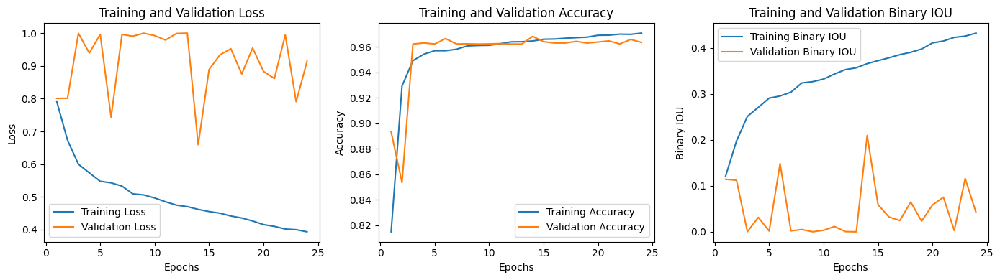

In [16]:
import matplotlib.pyplot as plt

# Assuming 'history' is the History object returned by model.fit()
def plot_training_history(history):
    # Extract metrics from the history object
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    binary_io_u_2 = history.history['binary_io_u_1']
    val_binary_io_u_2 = history.history['val_binary_io_u_1']

    epochs = range(1, len(loss) + 1)

    # Plot Loss
    plt.figure(figsize=(14, 4))
    plt.subplot(1, 3, 1)
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 3, 2)
    plt.plot(epochs, accuracy, label='Training Accuracy')
    plt.plot(epochs, val_accuracy, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot Binary IOU
    plt.subplot(1, 3, 3)
    plt.plot(epochs, binary_io_u_2, label='Training Binary IOU')
    plt.plot(epochs, val_binary_io_u_2, label='Validation Binary IOU')
    plt.title('Training and Validation Binary IOU')
    plt.xlabel('Epochs')
    plt.ylabel('Binary IOU')
    plt.legend()

    plt.tight_layout()
    plt.show()


# Call the function
plot_training_history(history)


In [18]:
test_mask_path = '/kaggle/working/test_masks/'
test_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
test_gen = DataGen(test_image_path, test_mask_path, test_annotations, 4, (256,256))
import tensorflow as tf
import numpy as np

import tensorflow as tf
import numpy as np

def calculate_test_iou(test_gen, model):
    # Initialize metric
    binary_iou = tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)
    
    # Process all batches
    num_batches = len(test_gen)
    for i in range(num_batches):
        # Get batch of images and masks
        images, true_masks = test_gen[i]
        
        # Generate predictions
        pred_masks = model.predict(images, verbose=0)
        
        # Update IoU metric
        binary_iou.update_state(y_true=true_masks, y_pred=pred_masks)
        
        # Print progress
        if (i + 1) % 10 == 0:
            print(f"Processed {i+1}/{num_batches} batches")
    
    # Calculate final IoU
    test_iou = binary_iou.result().numpy()
    print(f"\nTest IoU: {test_iou:.4f}")
    return test_iou

test_iou = calculate_test_iou(test_gen, model)

Processed 10/54 batches
Processed 20/54 batches
Processed 30/54 batches
Processed 40/54 batches
Processed 50/54 batches

Test IoU: 0.2256


In [19]:
model.save('model_small_256.h5')

In [34]:
# Compile the model
from keras.losses import Dice
from keras.metrics import BinaryIoU
from tensorflow.keras.optimizers import Adam
binary_iou = tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)
model.compile(optimizer = Adam(),
              loss = Dice(),
              metrics=['accuracy',binary_iou])

In [11]:
import tensorflow as tf
from tensorflow.keras import layers, models

def convBlock(inputs, filters, dropout_rate=0.0):
    c = layers.Conv2D(filters, kernel_size=(3, 3), padding="same", kernel_initializer='he_normal')(inputs)
    c = layers.BatchNormalization()(c)
    c = layers.ReLU()(c)
    if dropout_rate > 0:
        c = layers.Dropout(dropout_rate)(c)

    c = layers.Conv2D(filters, kernel_size=(3, 3), padding="same", kernel_initializer='he_normal')(c)
    c = layers.BatchNormalization()(c)
    c = layers.ReLU()(c)
    if dropout_rate > 0:
        c = layers.Dropout(dropout_rate)(c)
    return c

def encoderBlock(inputs, filters, dropout_rate=0.0):
    c = convBlock(inputs, filters, dropout_rate)
    m = layers.MaxPooling2D((2, 2))(c)
    return c, m

def decoderBlock(inputs, skip, filters, dropout_rate=0.0):
    u = layers.Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding="same")(inputs)
    u = layers.Concatenate()([u, skip])
    c = convBlock(u, filters, dropout_rate)
    return c

def uNet(image_size):
    inputs = layers.Input(image_size)

    # Encoder
    skip1, encoder_1 = encoderBlock(inputs, 64, dropout_rate=0.1)   # Level 1
    skip2, encoder_2 = encoderBlock(encoder_1, 128, dropout_rate=0.1) # Level 2
    skip3, encoder_3 = encoderBlock(encoder_2, 256, dropout_rate=0.2) # Level 3
    skip4, encoder_4 = encoderBlock(encoder_3, 512, dropout_rate=0.2) # Level 4

    # Bottleneck
    bottleneck = convBlock(encoder_4, 1024, dropout_rate=0.3)

    # Decoder
    decoder_4 = decoderBlock(bottleneck, skip4, 512, dropout_rate=0.2)
    decoder_3 = decoderBlock(decoder_4, skip3, 256, dropout_rate=0.2)
    decoder_2 = decoderBlock(decoder_3, skip2, 128, dropout_rate=0.1)
    decoder_1 = decoderBlock(decoder_2, skip1, 64, dropout_rate=0.1)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(decoder_1)

    model = models.Model(inputs, outputs)
    return model

input_shape = (256,256,3)
model = uNet(input_shape)

# Compile model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)]
)
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_38 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_38[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_36 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_36          │ (None, 256, 256,  │          0 │ re_lu_36[0][0]    │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_39 (Conv2D)  │ (None, 256, 256,  │     36,928 │ dropout_36[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_39[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_37 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_37          │ (None, 256, 256,  │          0 │ re_lu_37[0][0]    │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 128, 128,  │          0 │ dropout_37[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_40 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_8[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_40[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_38 (ReLU)     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_38          │ (None, 128, 128,  │          0 │ re_lu_38[0][0]    │
│ (Dropout)           │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_41 (Conv2D)  │ (None, 128, 128,  │    147,584 │ dropout_38[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_41[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_39 (ReLU)     │ (None, 128, 128,  │          0 │ batch_normalizat

 Total params: 31,055,297 (118.47 MB)

 Trainable params: 31,043,521 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [12]:
import warnings
warnings.filterwarnings("ignore")

# Updated callbacks
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        verbose=1
    )
]

train_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/train/'
train_mask_path = '/kaggle/working/train_masks/'
val_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/valid/'
val_mask_path = '/kaggle/working/val_masks/'
train_gen = DataGen(train_image_path, train_mask_path, train_annotations, 4, (256,256))
val_gen = DataGen(val_image_path, val_mask_path, val_annotations, 4, (256,256))

# Fit the model
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,  
    verbose=1,
    callbacks=callbacks
)

Epoch 1/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 94s 143ms/step - accuracy: 0.7888 - binary_io_u_2: 0.0338 - loss: 0.4567 - val_accuracy: 0.9621 - val_binary_io_u_2: 0.0000e+00 - val_loss: 0.1650
Epoch 2/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - accuracy: 0.9617 - binary_io_u_2: 0.0253 - loss: 0.1684 - val_accuracy: 0.9593 - val_binary_io_u_2: 2.5488e-04 - val_loss: 0.1625
Epoch 3/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - accuracy: 0.9634 - binary_io_u_2: 0.1623 - loss: 0.1330 - val_accuracy: 0.9619 - val_binary_io_u_2: 1.8534e-06 - val_loss: 0.1536
Epoch 4/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - accuracy: 0.9650 - binary_io_u_2: 0.2149 - loss: 0.1146 - val_accuracy: 0.9623 - val_binary_io_u_2: 0.0058 - val_loss: 0.1357
Epoch 5/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - accuracy: 0.9649 - binary_io_u_2: 0.2361 - loss: 0.1073 - val_accuracy: 0.9621 - val_binary_io_u_2: 4.8714e-04 - val_loss: 0.1503
Epoch 6/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 52s 139ms/step - accuracy: 0.

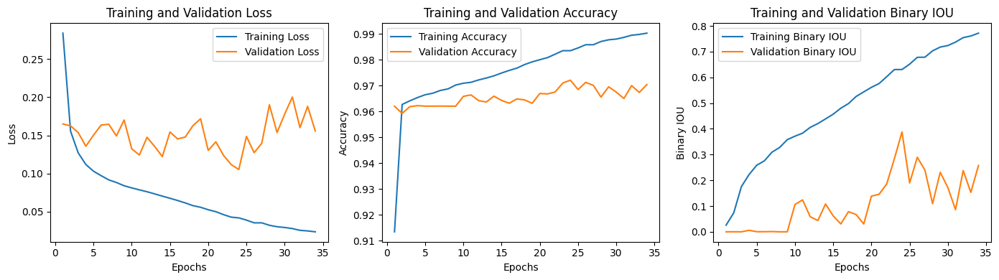

In [14]:
import matplotlib.pyplot as plt

# Assuming 'history' is the History object returned by model.fit()
def plot_training_history(history):
    # Extract metrics from the history object
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    binary_io_u_2 = history.history['binary_io_u_2']
    val_binary_io_u_2 = history.history['val_binary_io_u_2']

    epochs = range(1, len(loss) + 1)

    # Plot Loss
    plt.figure(figsize=(14, 4))
    plt.subplot(1, 3, 1)
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 3, 2)
    plt.plot(epochs, accuracy, label='Training Accuracy')
    plt.plot(epochs, val_accuracy, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot Binary IOU
    plt.subplot(1, 3, 3)
    plt.plot(epochs, binary_io_u_2, label='Training Binary IOU')
    plt.plot(epochs, val_binary_io_u_2, label='Validation Binary IOU')
    plt.title('Training and Validation Binary IOU')
    plt.xlabel('Epochs')
    plt.ylabel('Binary IOU')
    plt.legend()

    plt.tight_layout()
    plt.show()


# Call the function
plot_training_history(history)


In [15]:
test_mask_path = '/kaggle/working/test_masks/'
test_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
test_gen = DataGen(test_image_path, test_mask_path, test_annotations, 4, (256,256))
import tensorflow as tf
import numpy as np

import tensorflow as tf
import numpy as np

def calculate_test_iou(test_gen, model):
    # Initialize metric
    binary_iou = tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)
    
    # Process all batches
    num_batches = len(test_gen)
    for i in range(num_batches):
        # Get batch of images and masks
        images, true_masks = test_gen[i]
        
        # Generate predictions
        pred_masks = model.predict(images, verbose=0)
        
        # Update IoU metric
        binary_iou.update_state(y_true=true_masks, y_pred=pred_masks)
        
        # Print progress
        if (i + 1) % 10 == 0:
            print(f"Processed {i+1}/{num_batches} batches")
    
    # Calculate final IoU
    test_iou = binary_iou.result().numpy()
    print(f"\nTest IoU: {test_iou:.4f}")
    return test_iou

test_iou = calculate_test_iou(test_gen, model)

Processed 10/54 batches
Processed 20/54 batches
Processed 30/54 batches
Processed 40/54 batches
Processed 50/54 batches

Test IoU: 0.3753


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


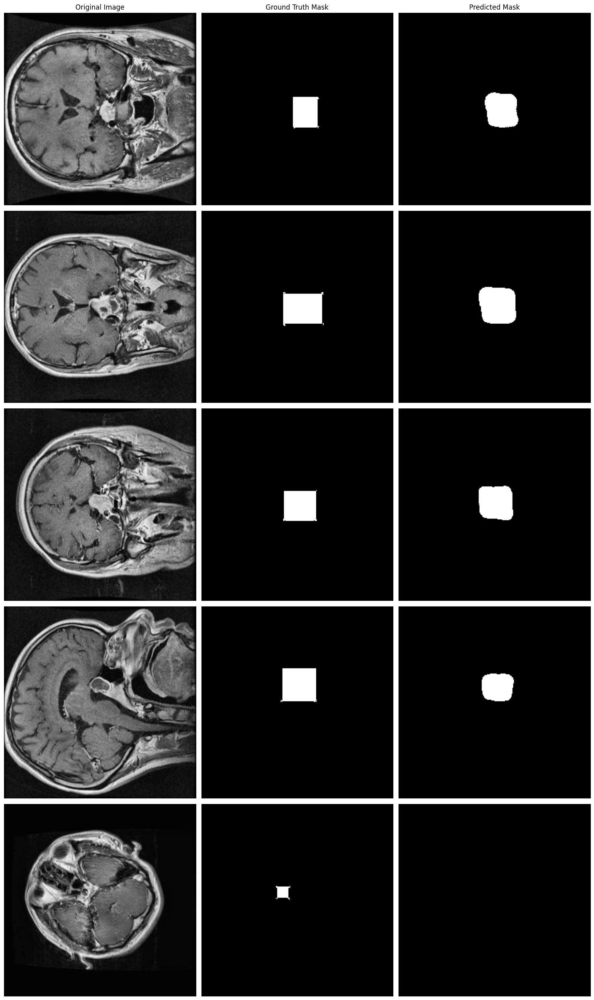

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Create figure
fig, axes = plt.subplots(5, 3, figsize=(15, 25))


# Get random batch indices
random_indices = random.sample(range(len(test_gen)), 5)

# Set column titles
titles = ['Original Image', 'Ground Truth Mask', 'Predicted Mask']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Plot images for each row
for row, idx in enumerate(random_indices):
    # Get image and mask from generator
    image, mask = test_gen[idx]
    
    # Get prediction
    pred = model.predict(image)
    pred = (pred[0] > 0.5).astype('int32')
    
    # Plot in columns
    axes[row, 0].imshow(image[0])  # Original
    axes[row, 1].imshow(mask[0].astype('int32'), cmap='gray')  # Mask
    axes[row, 2].imshow(pred, cmap='gray')  # Prediction
    
    # Remove axes ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


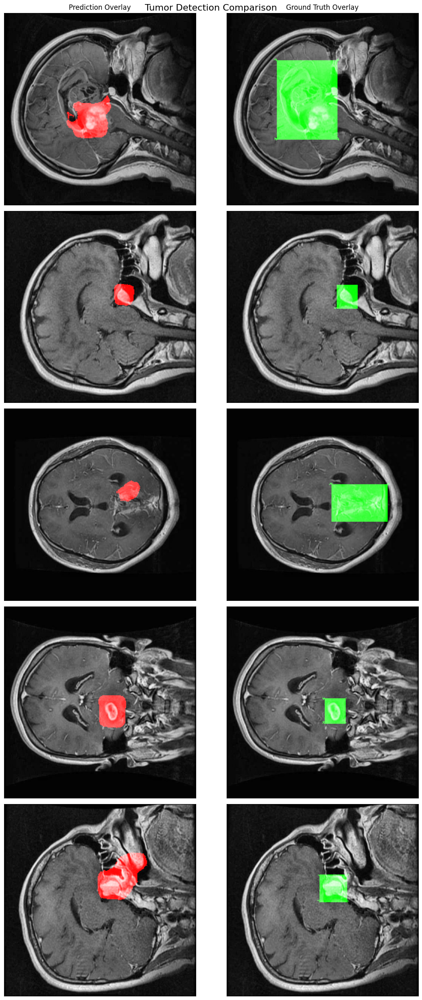

In [22]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Create figure
fig, axes = plt.subplots(5, 2, figsize=(12, 25))
fig.suptitle('Tumor Detection Comparison', fontsize=16)

# Set column titles
titles = ['Prediction Overlay', 'Ground Truth Overlay']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Get random indices
random_indices = random.sample(range(len(test_gen)), 5)

# Plot overlaid images
for row, idx in enumerate(random_indices):
    # Get image and mask from generator
    image, true_mask = test_gen[idx]
    
    # Get prediction
    pred_mask = model.predict(image)
    pred_mask = (pred_mask[0] > 0.5).astype('float32')
    
    # Convert true mask to float for blending
    true_mask = true_mask[0].astype('float32')
    
    # Create overlays
    # Red overlay for predictions
    pred_overlay = image[0].copy()
    pred_overlay[..., 0] = np.maximum(pred_overlay[..., 0], pred_mask[..., 0] * 255)
    
    # Green overlay for ground truth
    truth_overlay = image[0].copy()
    truth_overlay[..., 1] = np.maximum(truth_overlay[..., 1], true_mask[..., 0] * 255)
    
    # Plot overlays
    axes[row, 0].imshow(pred_overlay)
    axes[row, 1].imshow(truth_overlay)
    
    # Remove axes ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()


In [44]:
model.save('model2_256.h5')

In [23]:
import tensorflow as tf
from tensorflow.keras import layers, models

def convBlock(inputs, filters, dropout_rate=0.0):
    c = layers.Conv2D(filters, kernel_size=(3, 3), padding="same", kernel_initializer='he_normal')(inputs)
    c = layers.BatchNormalization()(c)
    c = layers.ReLU()(c)
    if dropout_rate > 0:
        c = layers.Dropout(dropout_rate)(c)

    c = layers.Conv2D(filters, kernel_size=(3, 3), padding="same", kernel_initializer='he_normal')(c)
    c = layers.BatchNormalization()(c)
    c = layers.ReLU()(c)
    if dropout_rate > 0:
        c = layers.Dropout(dropout_rate)(c)
    return c

def encoderBlock(inputs, filters, dropout_rate=0.0):
    c = convBlock(inputs, filters, dropout_rate)
    m = layers.MaxPooling2D((2, 2))(c)
    return c, m

def decoderBlock(inputs, skip, filters, dropout_rate=0.0):
    u = layers.Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding="same")(inputs)
    u = layers.Concatenate()([u, skip])
    c = convBlock(u, filters, dropout_rate)
    return c

def uNet(image_size):
    inputs = layers.Input(image_size)

    # Encoder
    skip1, encoder_1 = encoderBlock(inputs, 64, dropout_rate=0.1)   # Level 1
    skip2, encoder_2 = encoderBlock(encoder_1, 128, dropout_rate=0.1) # Level 2
    skip3, encoder_3 = encoderBlock(encoder_2, 256, dropout_rate=0.2) # Level 3
    skip4, encoder_4 = encoderBlock(encoder_3, 512, dropout_rate=0.2) # Level 4

    # Bottleneck
    bottleneck = convBlock(encoder_4, 1024, dropout_rate=0.3)

    # Decoder
    decoder_4 = decoderBlock(bottleneck, skip4, 512, dropout_rate=0.2)
    decoder_3 = decoderBlock(decoder_4, skip3, 256, dropout_rate=0.2)
    decoder_2 = decoderBlock(decoder_3, skip2, 128, dropout_rate=0.1)
    decoder_1 = decoderBlock(decoder_2, skip1, 64, dropout_rate=0.1)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(decoder_1)

    model = models.Model(inputs, outputs)
    return model

input_shape = (512,512,3)
model = uNet(input_shape)

# Compile model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)]
)
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_57 (Conv2D)  │ (None, 512, 512,  │      1,792 │ input_layer_3[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │        256 │ conv2d_57[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_54 (ReLU)     │ (None, 512, 512,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_54          │ (None, 512, 512,  │          0 │ re_lu_54[0][0]    │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_58 (Conv2D)  │ (None, 512, 512,  │     36,928 │ dropout_54[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │        256 │ conv2d_58[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_55 (ReLU)     │ (None, 512, 512,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_55          │ (None, 512, 512,  │          0 │ re_lu_55[0][0]    │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_12    │ (None, 256, 256,  │          0 │ dropout_55[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_59 (Conv2D)  │ (None, 256, 256,  │     73,856 │ max_pooling2d_12… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_59[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_56 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_56          │ (None, 256, 256,  │          0 │ re_lu_56[0][0]    │
│ (Dropout)           │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_60 (Conv2D)  │ (None, 256, 256,  │    147,584 │ dropout_56[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_60[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_57 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat

 Total params: 31,055,297 (118.47 MB)

 Trainable params: 31,043,521 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [33]:
from keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True, verbose=1)

train_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/train/'
train_mask_path = '/kaggle/working/train_masks/'
val_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/valid/'
val_mask_path = '/kaggle/working/val_masks/'
train_gen = DataGen(train_image_path, train_mask_path, train_annotations, 4)
val_gen = DataGen(val_image_path, val_mask_path, val_annotations, 4)

# Fit the model
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,  
    verbose=1,
    callbacks=[early_stopping]
)

Epoch 1/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 185s 492ms/step - accuracy: 0.9574 - binary_io_u_5: 0.2991 - loss: 0.5380 - val_accuracy: 0.9644 - val_binary_io_u_5: 0.0695 - val_loss: 0.8734
Epoch 2/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 185s 492ms/step - accuracy: 0.9580 - binary_io_u_5: 0.3059 - loss: 0.5341 - val_accuracy: 0.9628 - val_binary_io_u_5: 0.0234 - val_loss: 0.9561
Epoch 3/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 185s 492ms/step - accuracy: 0.9595 - binary_io_u_5: 0.3106 - loss: 0.5267 - val_accuracy: 0.9642 - val_binary_io_u_5: 0.0616 - val_loss: 0.8869
Epoch 4/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 185s 492ms/step - accuracy: 0.9584 - binary_io_u_5: 0.2926 - loss: 0.5408 - val_accuracy: 0.9668 - val_binary_io_u_5: 0.1551 - val_loss: 0.7320
Epoch 5/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 185s 493ms/step - accuracy: 0.9626 - binary_io_u_5: 0.3517 - loss: 0.4788 - val_accuracy: 0.9657 - val_binary_io_u_5: 0.2642 - val_loss: 0.5861
Epoch 6/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 185s 492ms/step - accuracy: 0.9611 - bin

In [34]:
test_mask_path = '/kaggle/working/test_masks/'
test_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
test_gen = DataGen(test_image_path, test_mask_path, test_annotations, 4)
import tensorflow as tf
import numpy as np

import tensorflow as tf
import numpy as np

def calculate_test_iou(test_gen, model):
    # Initialize metric
    binary_iou = tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)
    
    # Process all batches
    num_batches = len(test_gen)
    for i in range(num_batches):
        # Get batch of images and masks
        images, true_masks = test_gen[i]
        
        # Generate predictions
        pred_masks = model.predict(images, verbose=0)
        
        # Update IoU metric
        binary_iou.update_state(y_true=true_masks, y_pred=pred_masks)
        
        # Print progress
        if (i + 1) % 10 == 0:
            print(f"Processed {i+1}/{num_batches} batches")
    
    # Calculate final IoU
    test_iou = binary_iou.result().numpy()
    print(f"\nTest IoU: {test_iou:.4f}")
    return test_iou

test_iou = calculate_test_iou(test_gen, model)

Processed 10/54 batches
Processed 20/54 batches
Processed 30/54 batches
Processed 40/54 batches
Processed 50/54 batches

Test IoU: 0.2470


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


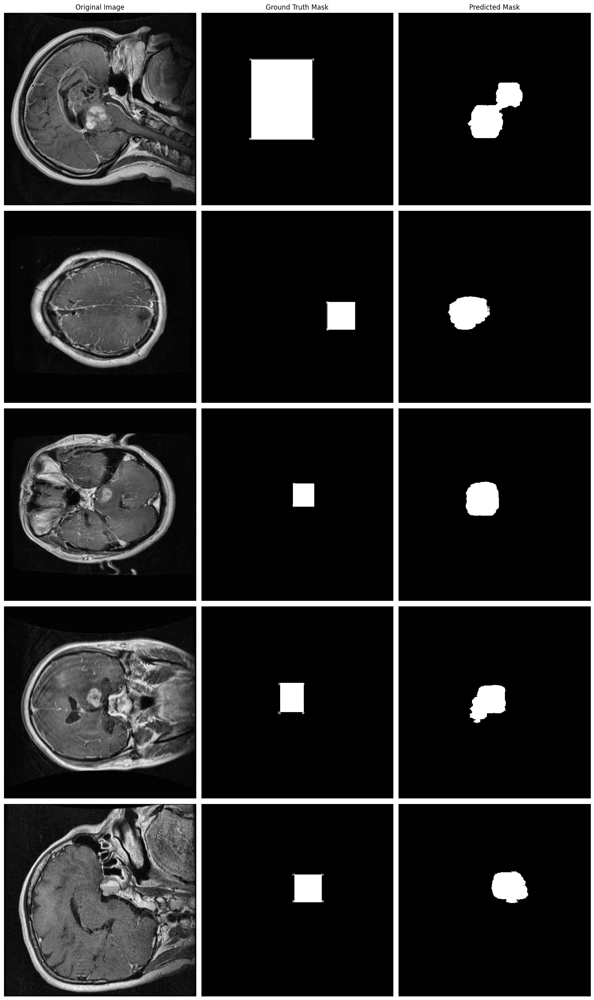

In [35]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Create figure
fig, axes = plt.subplots(5, 3, figsize=(15, 25))


# Get random batch indices
random_indices = random.sample(range(len(test_gen)), 5)

# Set column titles
titles = ['Original Image', 'Ground Truth Mask', 'Predicted Mask']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Plot images for each row
for row, idx in enumerate(random_indices):
    # Get image and mask from generator
    image, mask = test_gen[idx]
    
    # Get prediction
    pred = model.predict(image)
    pred = (pred[0] > 0.5).astype('int32')
    
    # Plot in columns
    axes[row, 0].imshow(image[0])  # Original
    axes[row, 1].imshow(mask[0].astype('int32'), cmap='gray')  # Mask
    axes[row, 2].imshow(pred, cmap='gray')  # Prediction
    
    # Remove axes ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


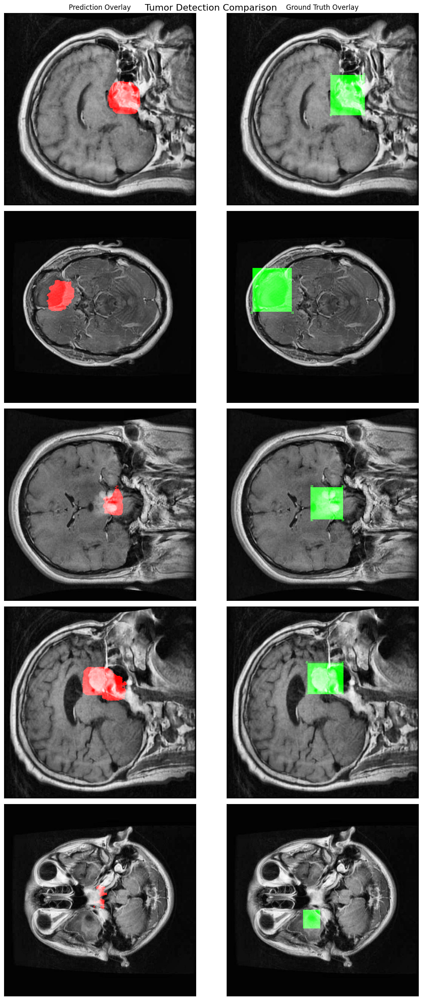

In [38]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Create figure
fig, axes = plt.subplots(5, 2, figsize=(12, 25))
fig.suptitle('Tumor Detection Comparison', fontsize=16)

# Set column titles
titles = ['Prediction Overlay', 'Ground Truth Overlay']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Get random indices
random_indices = random.sample(range(len(test_gen)), 5)

# Plot overlaid images
for row, idx in enumerate(random_indices):
    # Get image and mask from generator
    image, true_mask = test_gen[idx]
    
    # Get prediction
    pred_mask = model.predict(image)
    pred_mask = (pred_mask[0] > 0.5).astype('float32')
    
    # Convert true mask to float for blending
    true_mask = true_mask[0].astype('float32')
    
    # Create overlays
    # Red overlay for predictions
    pred_overlay = image[0].copy()
    pred_overlay[..., 0] = np.maximum(pred_overlay[..., 0], pred_mask[..., 0] * 255)
    
    # Green overlay for ground truth
    truth_overlay = image[0].copy()
    truth_overlay[..., 1] = np.maximum(truth_overlay[..., 1], true_mask[..., 0] * 255)
    
    # Plot overlays
    axes[row, 0].imshow(pred_overlay)
    axes[row, 1].imshow(truth_overlay)
    
    # Remove axes ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()


In [43]:
import tensorflow as tf
from tensorflow.keras import layers, models
from keras.losses import Dice
def convBlock(inputs, filters, dropout_rate=0.0):
    c = layers.Conv2D(filters, kernel_size=(3, 3), padding="same", kernel_initializer='he_normal')(inputs)
    c = layers.BatchNormalization()(c)
    c = layers.ReLU()(c)
    if dropout_rate > 0:
        c = layers.Dropout(dropout_rate)(c)

    c = layers.Conv2D(filters, kernel_size=(3, 3), padding="same", kernel_initializer='he_normal')(c)
    c = layers.BatchNormalization()(c)
    c = layers.ReLU()(c)
    if dropout_rate > 0:
        c = layers.Dropout(dropout_rate)(c)
    return c

def encoderBlock(inputs, filters, dropout_rate=0.0):
    c = convBlock(inputs, filters, dropout_rate)
    m = layers.MaxPooling2D((2, 2))(c)
    return c, m

def decoderBlock(inputs, skip, filters, dropout_rate=0.0):
    u = layers.Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding="same")(inputs)
    u = layers.Concatenate()([u, skip])
    c = convBlock(u, filters, dropout_rate)
    return c

def uNet(image_size):
    inputs = layers.Input(image_size)

    # Encoder
    skip1, encoder_1 = encoderBlock(inputs, 64, dropout_rate=0.1)   # Level 1
    skip2, encoder_2 = encoderBlock(encoder_1, 128, dropout_rate=0.1) # Level 2
    skip3, encoder_3 = encoderBlock(encoder_2, 256, dropout_rate=0.2) # Level 3
    skip4, encoder_4 = encoderBlock(encoder_3, 512, dropout_rate=0.2) # Level 4

    # Bottleneck
    bottleneck = convBlock(encoder_4, 1024, dropout_rate=0.3)

    # Decoder
    decoder_4 = decoderBlock(bottleneck, skip4, 512, dropout_rate=0.2)
    decoder_3 = decoderBlock(decoder_4, skip3, 256, dropout_rate=0.2)
    decoder_2 = decoderBlock(decoder_3, skip2, 128, dropout_rate=0.1)
    decoder_1 = decoderBlock(decoder_2, skip1, 64, dropout_rate=0.1)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(decoder_1)

    model = models.Model(inputs, outputs)
    return model

input_shape = (256,256,3)
model = uNet(input_shape)

# Compile model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=Dice(),
    metrics=['accuracy', tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)]
)
model.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_114 (Conv2D) │ (None, 256, 256,  │      1,792 │ input_layer_6[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_114[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_108 (ReLU)    │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_108         │ (None, 256, 256,  │          0 │ re_lu_108[0][0]   │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_115 (Conv2D) │ (None, 256, 256,  │     36,928 │ dropout_108[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_115[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_109 (ReLU)    │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_109         │ (None, 256, 256,  │          0 │ re_lu_109[0][0]   │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_24    │ (None, 128, 128,  │          0 │ dropout_109[0][0] │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_116 (Conv2D) │ (None, 128, 128,  │     73,856 │ max_pooling2d_24… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_116[0][0]  │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_110 (ReLU)    │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_110         │ (None, 128, 128,  │          0 │ re_lu_110[0][0]   │
│ (Dropout)           │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_117 (Conv2D) │ (None, 128, 128,  │    147,584 │ dropout_110[0][0] │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_117[0][0]  │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_111 (ReLU)    │ (None, 128, 128,  │          0 │ batch_normalizat

 Total params: 31,055,297 (118.47 MB)

 Trainable params: 31,043,521 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [44]:
from keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True, verbose=1)

train_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/train/'
train_mask_path = '/kaggle/working/train_masks/'
val_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/valid/'
val_mask_path = '/kaggle/working/val_masks/'
train_gen = DataGen(train_image_path, train_mask_path, train_annotations, 4, (256,256))
val_gen = DataGen(val_image_path, val_mask_path, val_annotations, 4, (256,256))

# Fit the model
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,  
    verbose=1,
    callbacks=[early_stopping]
)

Epoch 1/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 95s 144ms/step - accuracy: 0.7039 - binary_io_u_11: 0.1037 - loss: 0.8276 - val_accuracy: 0.9589 - val_binary_io_u_11: 0.1069 - val_loss: 0.8554
Epoch 2/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 52s 139ms/step - accuracy: 0.9304 - binary_io_u_11: 0.2349 - loss: 0.6891 - val_accuracy: 0.9627 - val_binary_io_u_11: 0.0279 - val_loss: 0.9445
Epoch 3/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 53s 139ms/step - accuracy: 0.9466 - binary_io_u_11: 0.2808 - loss: 0.6075 - val_accuracy: 0.9624 - val_binary_io_u_11: 0.0104 - val_loss: 0.9742
Epoch 4/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 52s 139ms/step - accuracy: 0.9538 - binary_io_u_11: 0.3056 - loss: 0.5625 - val_accuracy: 0.9621 - val_binary_io_u_11: 0.0000e+00 - val_loss: 0.9937
Epoch 5/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 53s 139ms/step - accuracy: 0.9566 - binary_io_u_11: 0.3251 - loss: 0.5277 - val_accuracy: 0.9629 - val_binary_io_u_11: 0.0239 - val_loss: 0.9549
Epoch 6/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 53s 140ms/step - accuracy: 0.96

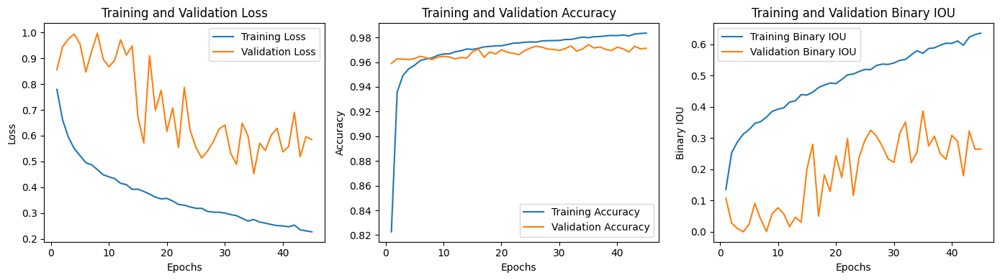

In [47]:
import matplotlib.pyplot as plt

# Assuming 'history' is the History object returned by model.fit()
def plot_training_history(history):
    # Extract metrics from the history object
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    binary_io_u_2 = history.history['binary_io_u_11']
    val_binary_io_u_2 = history.history['val_binary_io_u_11']

    epochs = range(1, len(loss) + 1)

    # Plot Loss
    plt.figure(figsize=(14, 4))
    plt.subplot(1, 3, 1)
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 3, 2)
    plt.plot(epochs, accuracy, label='Training Accuracy')
    plt.plot(epochs, val_accuracy, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot Binary IOU
    plt.subplot(1, 3, 3)
    plt.plot(epochs, binary_io_u_2, label='Training Binary IOU')
    plt.plot(epochs, val_binary_io_u_2, label='Validation Binary IOU')
    plt.title('Training and Validation Binary IOU')
    plt.xlabel('Epochs')
    plt.ylabel('Binary IOU')
    plt.legend()

    plt.tight_layout()
    plt.show()


# Call the function
plot_training_history(history)


In [46]:
test_mask_path = '/kaggle/working/test_masks/'
test_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
test_gen = DataGen(test_image_path, test_mask_path, test_annotations, 4, (256,256))
import tensorflow as tf
import numpy as np

import tensorflow as tf
import numpy as np

def calculate_test_iou(test_gen, model):
    # Initialize metric
    binary_iou = tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)
    
    # Process all batches
    num_batches = len(test_gen)
    for i in range(num_batches):
        # Get batch of images and masks
        images, true_masks = test_gen[i]
        
        # Generate predictions
        pred_masks = model.predict(images, verbose=0)
        
        # Update IoU metric
        binary_iou.update_state(y_true=true_masks, y_pred=pred_masks)
        
        # Print progress
        if (i + 1) % 10 == 0:
            print(f"Processed {i+1}/{num_batches} batches")
    
    # Calculate final IoU
    test_iou = binary_iou.result().numpy()
    print(f"\nTest IoU: {test_iou:.4f}")
    return test_iou

test_iou = calculate_test_iou(test_gen, model)

Processed 10/54 batches
Processed 20/54 batches
Processed 30/54 batches
Processed 40/54 batches
Processed 50/54 batches

Test IoU: 0.3861


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


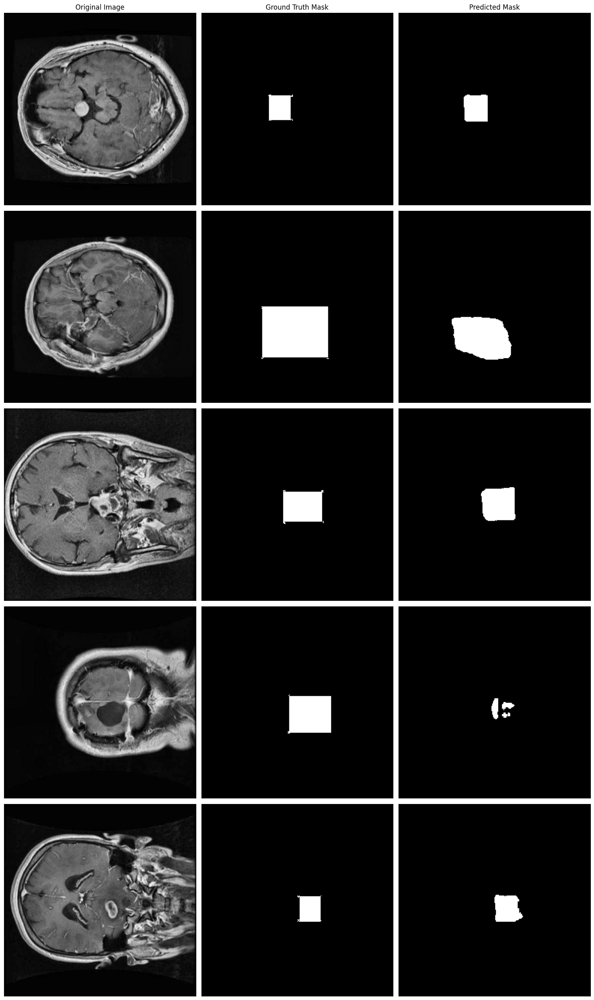

In [49]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Create figure
fig, axes = plt.subplots(5, 3, figsize=(15, 25))


# Get random batch indices
random_indices = random.sample(range(len(test_gen)), 5)

# Set column titles
titles = ['Original Image', 'Ground Truth Mask', 'Predicted Mask']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Plot images for each row
for row, idx in enumerate(random_indices):
    # Get image and mask from generator
    image, mask = test_gen[idx]
    
    # Get prediction
    pred = model.predict(image)
    pred = (pred[0] > 0.5).astype('int32')
    
    # Plot in columns
    axes[row, 0].imshow(image[0])  # Original
    axes[row, 1].imshow(mask[0].astype('int32'), cmap='gray')  # Mask
    axes[row, 2].imshow(pred, cmap='gray')  # Prediction
    
    # Remove axes ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


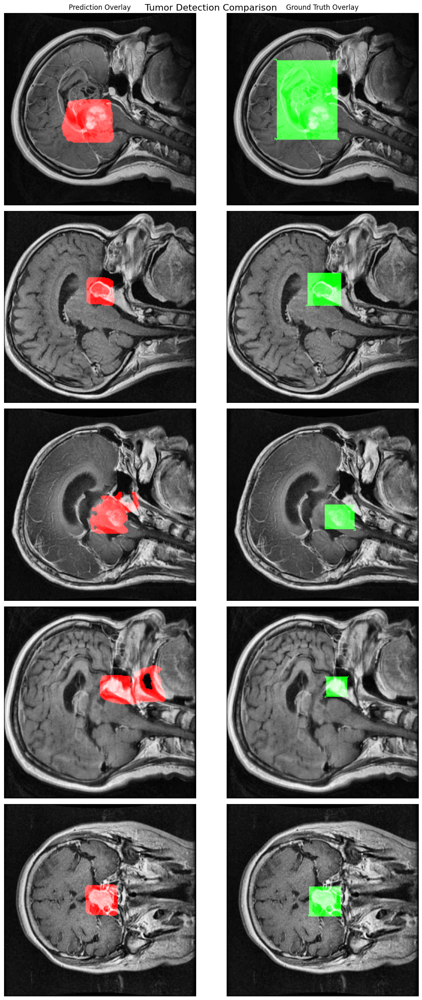

In [56]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Create figure
fig, axes = plt.subplots(5, 2, figsize=(12, 25))
fig.suptitle('Tumor Detection Comparison', fontsize=16)

# Set column titles
titles = ['Prediction Overlay', 'Ground Truth Overlay']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Get random indices
random_indices = random.sample(range(len(test_gen)), 5)

# Plot overlaid images
for row, idx in enumerate(random_indices):
    # Get image and mask from generator
    image, true_mask = test_gen[idx]
    
    # Get prediction
    pred_mask = model.predict(image)
    pred_mask = (pred_mask[0] > 0.5).astype('float32')
    
    # Convert true mask to float for blending
    true_mask = true_mask[0].astype('float32')
    
    # Create overlays
    # Red overlay for predictions
    pred_overlay = image[0].copy()
    pred_overlay[..., 0] = np.maximum(pred_overlay[..., 0], pred_mask[..., 0] * 255)
    
    # Green overlay for ground truth
    truth_overlay = image[0].copy()
    truth_overlay[..., 1] = np.maximum(truth_overlay[..., 1], true_mask[..., 0] * 255)
    
    # Plot overlays
    axes[row, 0].imshow(pred_overlay)
    axes[row, 1].imshow(truth_overlay)
    
    # Remove axes ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()
